In [1]:
#Basic computaion & preprocessing
import pandas as pd
import numpy as np

#libraries for plots
import matplotlib.pyplot as plt
import seaborn as sns

#Pandas expand rows dependencies
sns.set(style="whitegrid")
pd.set_option('display.max_columns', 400)
pd.set_option('display.max_rows', 400)
pd.set_option('display.max_colwidth', 200)

#Matplotlib magic function
%matplotlib inline
pd.options.display.float_format = '{:.2f}'.format

#Ignore warning
import warnings
warnings.filterwarnings('ignore')
# To build the model
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import learning_curve, GridSearchCV
from sklearn import metrics
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
# To Scale the data
from sklearn.preprocessing import MinMaxScaler

In [2]:
df = pd.read_csv(r"C:\Users\Nmahanta\Desktop\telecom_churn_data.csv")

In [3]:
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.38,214.82,213.80,21.10,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,0.00,0.00,0.00,0.00,nan,nan,0.16,nan,nan,nan,4.13,nan,nan,nan,1.15,nan,nan,nan,5.44,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,0.00,0.00,5.44,0.00,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,na

In [4]:
data_dict = pd.read_excel(r"C:\Users\Nmahanta\Desktop\Data+Dictionary-+Telecom+Churn+Case+Study.xlsx")
data_dict

,Acronyms,Descriptions
0,MOBILE_NUMBER,Customer phone number
1,CIRCLE_ID,Telecom circle area to which the customer belongs to
2,LOC,Local calls - within same telecom circle
3,STD,STD calls - outside the calling circle
4,IC,Incoming calls
5,OG,Outgoing calls
6,T2T,"Operator T to T, i.e. within same operator (mobile to mobile)"
7,T2M,Operator T to other operator mobile
8,T2O,Operator T to other operator fixed line
9,T2F,Operator T to fixed lines of T


In [5]:
print("Number of rows in the data :",df.shape[0])
print("Number of columns in the data :",df.shape[1])

Number of rows in the data : 99999
Number of columns in the data : 226


In [6]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   mobile_number             99999 non-null  int64  
 1   circle_id                 99999 non-null  int64  
 2   loc_og_t2o_mou            98981 non-null  float64
 3   std_og_t2o_mou            98981 non-null  float64
 4   loc_ic_t2o_mou            98981 non-null  float64
 5   last_date_of_month_6      99999 non-null  object 
 6   last_date_of_month_7      99398 non-null  object 
 7   last_date_of_month_8      98899 non-null  object 
 8   last_date_of_month_9      98340 non-null  object 
 9   arpu_6                    99999 non-null  float64
 10  arpu_7                    99999 non-null  float64
 11  arpu_8                    99999 non-null  float64
 12  arpu_9                    99999 non-null  float64
 13  onnet_mou_6               96062 non-null  float64
 14  onnet

In [7]:
df.rename(columns={'aug_vbc_3g':'vbc_3g_8', 'jul_vbc_3g':'vbc_3g_7', 'jun_vbc_3g':'vbc_3g_6','sep_vbc_3g':'vbc_3g_9'}, inplace=True)

In [8]:
df.duplicated(subset='mobile_number').sum()

0

In [9]:
df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
count,99999.00,99999.00,98981.00,98981.00,98981.00,99999.00,99999.00,99999.00,99999.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,99999.00,99999.00,99999.00,99999.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621

In [10]:
#single value, drop the column
df.drop(['circle_id','mobile_number'],axis=1,inplace=True)

In [11]:
null = 100*(df.isnull().sum()/len(df))
null[null>0]

loc_og_t2o_mou              1.02
std_og_t2o_mou              1.02
loc_ic_t2o_mou              1.02
last_date_of_month_7        0.60
last_date_of_month_8        1.10
last_date_of_month_9        1.66
onnet_mou_6                 3.94
onnet_mou_7                 3.86
onnet_mou_8                 5.38
onnet_mou_9                 7.75
offnet_mou_6                3.94
offnet_mou_7                3.86
offnet_mou_8                5.38
offnet_mou_9                7.75
roam_ic_mou_6               3.94
roam_ic_mou_7               3.86
roam_ic_mou_8               5.38
roam_ic_mou_9               7.75
roam_og_mou_6               3.94
roam_og_mou_7               3.86
roam_og_mou_8               5.38
roam_og_mou_9               7.75
loc_og_t2t_mou_6            3.94
loc_og_t2t_mou_7            3.86
loc_og_t2t_mou_8            5.38
loc_og_t2t_mou_9            7.75
loc_og_t2m_mou_6            3.94
loc_og_t2m_mou_7            3.86
loc_og_t2m_mou_8            5.38
loc_og_t2m_mou_9            7.75
loc_og_t2f

In [12]:
#Lets impute all these columns with '0' as they look important for model building
cols = ['total_rech_data_6','total_rech_data_7','total_rech_data_8','total_rech_data_9','max_rech_data_6','max_rech_data_7','max_rech_data_8','max_rech_data_9','count_rech_2g_6','count_rech_2g_7','count_rech_2g_8','count_rech_3g_6','count_rech_3g_7','count_rech_3g_8','count_rech_2g_9','count_rech_3g_9','av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','av_rech_amt_data_9','arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_2g_6','arpu_2g_7','arpu_2g_8','arpu_3g_9','arpu_2g_9','night_pck_user_9','night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8','fb_user_9']
df[cols]=df[cols].replace(np.nan, 0)

In [13]:
#Dealing with date columns. 
import re
df.filter(regex=('date')).columns

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'last_date_of_month_9', 'date_of_last_rech_6', 'date_of_last_rech_7',
       'date_of_last_rech_8', 'date_of_last_rech_9',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'date_of_last_rech_data_9'],
      dtype='object')

In [14]:
null = 100*(df.isnull().sum()/len(df))
null[null>0]

loc_og_t2o_mou              1.02
std_og_t2o_mou              1.02
loc_ic_t2o_mou              1.02
last_date_of_month_7        0.60
last_date_of_month_8        1.10
last_date_of_month_9        1.66
onnet_mou_6                 3.94
onnet_mou_7                 3.86
onnet_mou_8                 5.38
onnet_mou_9                 7.75
offnet_mou_6                3.94
offnet_mou_7                3.86
offnet_mou_8                5.38
offnet_mou_9                7.75
roam_ic_mou_6               3.94
roam_ic_mou_7               3.86
roam_ic_mou_8               5.38
roam_ic_mou_9               7.75
roam_og_mou_6               3.94
roam_og_mou_7               3.86
roam_og_mou_8               5.38
roam_og_mou_9               7.75
loc_og_t2t_mou_6            3.94
loc_og_t2t_mou_7            3.86
loc_og_t2t_mou_8            5.38
loc_og_t2t_mou_9            7.75
loc_og_t2m_mou_6            3.94
loc_og_t2m_mou_7            3.86
loc_og_t2m_mou_8            5.38
loc_og_t2m_mou_9            7.75
loc_og_t2f

In [15]:
cols = ['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8','last_date_of_month_9', 'date_of_last_rech_6', 'date_of_last_rech_7','date_of_last_rech_8', 'date_of_last_rech_9','date_of_last_rech_data_6', 'date_of_last_rech_data_7','date_of_last_rech_data_8', 'date_of_last_rech_data_9']
df.drop(cols,axis=1,inplace=True)

In [16]:
#Dropping columns with only value '0':
cols = ['loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8']
df.drop(cols,axis=1,inplace=True)

In [17]:
null = 100*(df.isnull().sum()/len(df)) 
null[null > 5]

onnet_mou_8        5.38
onnet_mou_9        7.75
offnet_mou_8       5.38
offnet_mou_9       7.75
roam_ic_mou_8      5.38
roam_ic_mou_9      7.75
roam_og_mou_8      5.38
roam_og_mou_9      7.75
loc_og_t2t_mou_8   5.38
loc_og_t2t_mou_9   7.75
loc_og_t2m_mou_8   5.38
loc_og_t2m_mou_9   7.75
loc_og_t2f_mou_8   5.38
loc_og_t2f_mou_9   7.75
loc_og_t2c_mou_8   5.38
loc_og_t2c_mou_9   7.75
loc_og_mou_8       5.38
loc_og_mou_9       7.75
std_og_t2t_mou_8   5.38
std_og_t2t_mou_9   7.75
std_og_t2m_mou_8   5.38
std_og_t2m_mou_9   7.75
std_og_t2f_mou_8   5.38
std_og_t2f_mou_9   7.75
std_og_t2c_mou_9   7.75
std_og_mou_8       5.38
std_og_mou_9       7.75
isd_og_mou_8       5.38
isd_og_mou_9       7.75
spl_og_mou_8       5.38
spl_og_mou_9       7.75
og_others_8        5.38
og_others_9        7.75
loc_ic_t2t_mou_8   5.38
loc_ic_t2t_mou_9   7.75
loc_ic_t2m_mou_8   5.38
loc_ic_t2m_mou_9   7.75
loc_ic_t2f_mou_8   5.38
loc_ic_t2f_mou_9   7.75
loc_ic_mou_8       5.38
loc_ic_mou_9       7.75
std_ic_t2t_mou_8

In [18]:
null5 = list(null[null > 5].index)
df[null5]=df[null5].replace(np.nan,0)

In [19]:
null = 100*(df.isnull().sum()/len(df)) 
null[null > 0]

onnet_mou_6        3.94
onnet_mou_7        3.86
offnet_mou_6       3.94
offnet_mou_7       3.86
roam_ic_mou_6      3.94
roam_ic_mou_7      3.86
roam_og_mou_6      3.94
roam_og_mou_7      3.86
loc_og_t2t_mou_6   3.94
loc_og_t2t_mou_7   3.86
loc_og_t2m_mou_6   3.94
loc_og_t2m_mou_7   3.86
loc_og_t2f_mou_6   3.94
loc_og_t2f_mou_7   3.86
loc_og_t2c_mou_6   3.94
loc_og_t2c_mou_7   3.86
loc_og_mou_6       3.94
loc_og_mou_7       3.86
std_og_t2t_mou_6   3.94
std_og_t2t_mou_7   3.86
std_og_t2m_mou_6   3.94
std_og_t2m_mou_7   3.86
std_og_t2f_mou_6   3.94
std_og_t2f_mou_7   3.86
std_og_mou_6       3.94
std_og_mou_7       3.86
isd_og_mou_6       3.94
isd_og_mou_7       3.86
spl_og_mou_6       3.94
spl_og_mou_7       3.86
og_others_6        3.94
og_others_7        3.86
loc_ic_t2t_mou_6   3.94
loc_ic_t2t_mou_7   3.86
loc_ic_t2m_mou_6   3.94
loc_ic_t2m_mou_7   3.86
loc_ic_t2f_mou_6   3.94
loc_ic_t2f_mou_7   3.86
loc_ic_mou_6       3.94
loc_ic_mou_7       3.86
std_ic_t2t_mou_6   3.94
std_ic_t2t_mou_7

In [20]:
null0 = list(null[null > 0].index)
df[null0]=df[null0].replace(np.nan,df[null0].mean())

In [21]:
df.isnull().sum()

arpu_6                0
arpu_7                0
arpu_8                0
arpu_9                0
onnet_mou_6           0
onnet_mou_7           0
onnet_mou_8           0
onnet_mou_9           0
offnet_mou_6          0
offnet_mou_7          0
offnet_mou_8          0
offnet_mou_9          0
roam_ic_mou_6         0
roam_ic_mou_7         0
roam_ic_mou_8         0
roam_ic_mou_9         0
roam_og_mou_6         0
roam_og_mou_7         0
roam_og_mou_8         0
roam_og_mou_9         0
loc_og_t2t_mou_6      0
loc_og_t2t_mou_7      0
loc_og_t2t_mou_8      0
loc_og_t2t_mou_9      0
loc_og_t2m_mou_6      0
loc_og_t2m_mou_7      0
loc_og_t2m_mou_8      0
loc_og_t2m_mou_9      0
loc_og_t2f_mou_6      0
loc_og_t2f_mou_7      0
loc_og_t2f_mou_8      0
loc_og_t2f_mou_9      0
loc_og_t2c_mou_6      0
loc_og_t2c_mou_7      0
loc_og_t2c_mou_8      0
loc_og_t2c_mou_9      0
loc_og_mou_6          0
loc_og_mou_7          0
loc_og_mou_8          0
loc_og_mou_9          0
std_og_t2t_mou_6      0
std_og_t2t_mou_7

In [22]:
#Total amount spent on data charge in the month 6,7,8
#total amount = amount of data * number of times of recharge(data)
df['total_rech_amt_data_6'] = df['total_rech_data_6']*df['av_rech_amt_data_6']
df['total_rech_amt_data_7'] = df['total_rech_data_7']*df['av_rech_amt_data_7']
df['total_rech_amt_data_8'] = df['total_rech_data_8']*df['av_rech_amt_data_8']

In [23]:
#Total amount spent on both call and data
df['monthly_rech_6'] = df['total_rech_amt_6']+df['total_rech_amt_data_6']
df['monthly_rech_7'] = df['total_rech_amt_7']+df['total_rech_amt_data_7']
df['monthly_rech_8'] = df['total_rech_amt_8']+df['total_rech_amt_data_8']

In [24]:
#Average recharge done by customer in the month 6,7
df['avg_rech+6+7'] = (df['monthly_rech_6'] + df['monthly_rech_7'])/2

In [25]:
hvc = df[df['avg_rech+6+7']>df['avg_rech+6+7'].quantile(0.7)]

In [26]:
hvc.shape

(29953, 210)

In [27]:
hvc.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,monthly_rech_6,monthly_rech_7,monthly_rech_8,avg_rech+6+7
0,197.38,214.82,213.80,21.10,132.40,133.67,0.00,0.00,197.94,197.05,0.00,0.00,9.95,7.15,0.00,0.00,13.91,9.82,0.00,0.00,47.10,46.47,0.00,0.00,93.34,91.40,0.00,0.00,3.75,3.79,0.00,0.00,1.12,1.37,0.00,0.00,144.20,141.67,0.00,0.00,79.83,83.30,0.00,0.00,87.30,90.80,0.00,0.00,1.13,1.12,0.00,0.00,0.00,168.26,175.22,0.00,0.00,0.80,0.78,0.00,0.00,3.92,4.98,0.00,0.00,0.45,0.03,0.00,0.00,0.00,0.00,0.00,0.00,47.92,47.99,0.16,0.00,107.48,107.12,4.13,0.00,12.08,12.60,1.15,0.00,167.49,167.72,5.44,0.00,9.58,10.01,0.00,0.00,20.72,21.66,0.00,0.00,2.16,2.22,0.00,0.00,0.00,32.46,33.89,0.00,0.00,0.00,0.00,5.44,0.00,0.06,0.03,0.00,0.00,7.46,8.33,0.00,0.00,0.85,1.01,0.00,0.00,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,1.00,1.00,1.00,0.00,252.00,252.00,252.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,0.00,252.00,252.00,252.00,0.00,30.13,1.32,5.75,0.00,83.57,150.76,109.61,0.00,212.17,212.17,212.17,0.00,212.17,212.17,212.17,0.00,0.00,0.00,0.00,0.00,0,0,0,0,

In [28]:
#churn
cols = ['total_ic_mou_9','total_og_mou_9','vol_3g_mb_9', 'vol_2g_mb_9']
hvc['churn']=hvc[cols].apply(lambda x: 1 if ((x['total_ic_mou_9']==0.00)  & (x['total_og_mou_9']==0.00) & (x['vol_3g_mb_9']==0.00) & (x['vol_2g_mb_9']==0.00)) else 0, axis=1)

In [29]:
#Number of churn customers:
print("Total number of customers churned :",round(100*(len(hvc[hvc['churn']==1])/len(hvc)),2))
print("Total number of customers not churned :",round(100*(len(hvc[hvc['churn']==0])/len(hvc)),2))

Total number of customers churned : 8.12
Total number of customers not churned : 91.88


In [30]:
#filter all columns where last char in column name is _9
cols = hvc.filter(regex=('_9')).columns
#drop these columns as mentioned
hvc.drop(cols,axis=1,inplace=True)

In [31]:
hvc.shape

(29953, 159)

In [32]:
hvc.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,monthly_rech_6,monthly_rech_7,monthly_rech_8,avg_rech+6+7,churn
count,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00
mean,558.82,561.16,508.89,263.30,270.44,234.35,377.38,381.76,335.12,16.30,12.77,12.51,26.85,20.33,19.89,85.43,86.59,78.15,165.00,164.72,151.81,6.42,6.49,5.89,1.60,1.91,1.70,256.85,257.82,235.86,167.34,175.87,148.59,181.02,189.59,157.32,1.83,1.85,1.59,350.19,367.

In [33]:
#Derive new features
#columns belong to 6th and 7th month
columns = hvc.filter(regex='_6|_7').columns.str[:-2][:-1]
columns.unique()

Index(['arpu', 'onnet_mou', 'offnet_mou', 'roam_ic_mou', 'roam_og_mou',
       'loc_og_t2t_mou', 'loc_og_t2m_mou', 'loc_og_t2f_mou', 'loc_og_t2c_mou',
       'loc_og_mou', 'std_og_t2t_mou', 'std_og_t2m_mou', 'std_og_t2f_mou',
       'std_og_mou', 'isd_og_mou', 'spl_og_mou', 'og_others', 'total_og_mou',
       'loc_ic_t2t_mou', 'loc_ic_t2m_mou', 'loc_ic_t2f_mou', 'loc_ic_mou',
       'std_ic_t2t_mou', 'std_ic_t2m_mou', 'std_ic_t2f_mou', 'std_ic_mou',
       'total_ic_mou', 'spl_ic_mou', 'isd_ic_mou', 'ic_others',
       'total_rech_num', 'total_rech_amt', 'max_rech_amt', 'last_day_rch_amt',
       'total_rech_data', 'max_rech_data', 'count_rech_2g', 'count_rech_3g',
       'av_rech_amt_data', 'vol_2g_mb', 'vol_3g_mb', 'arpu_3g', 'arpu_2g',
       'night_pck_user', 'monthly_2g', 'sachet_2g', 'monthly_3g', 'sachet_3g',
       'fb_user', 'vbc_3g', 'total_rech_amt_data', 'monthly_rech'],
      dtype='object')

In [34]:
#Average of columns belog to month 6 and 7
for idx, col in enumerate(columns.unique()):
    avg_col_name = "avg_"+col+"_av67" 
    col_6 = col+"_6"
    col_7 = col+"_7"
    hvc[avg_col_name] = (hvc[col_6]  + hvc[col_7])/ 2

In [35]:
hvc.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,monthly_rech_6,monthly_rech_7,monthly_rech_8,avg_rech+6+7,churn,avg_arpu_av67,avg_onnet_mou_av67,avg_offnet_mou_av67,avg_roam_ic_mou_av67,avg_roam_og_mou_av67,avg_loc_og_t2t_mou_av67,avg_loc_og_t2m_mou_av67,avg_loc_og_t2f_mou_av67,avg_loc_og_t2c_mou_av67,avg_loc_og_mou_av67,avg_std_og_t2t_mou_av67,avg_std_og_t2m_mou_av67,avg_std_og_t2f_mou_av67,avg_std_og_mou_av67,avg_isd_og_mou_av67,avg_spl_og_mou_av67,avg_og_others_av67,avg_total_og_mou_av67,avg_loc_ic_t2t_mou_av67,avg_loc_ic_t2m_mou_av67,avg_loc_ic_t2f_mou_av67,avg_loc_ic_mou_av67,avg_std_ic_t2t_mou_av67,avg_std_ic_t2m_mou_av67,avg_std_ic_t2f_mou_av67,avg_std_ic_mou_av67,avg_total_ic_mou_av67,avg_spl_ic_mou_av67,avg_isd_ic_mou_av67,avg_ic_others_av67,avg_total_rech_num_av67,avg_total_rech_amt_av67,avg_max_rech_amt_av67,avg_last_day_rch_amt_av67,avg_total_rech_data_av67,avg_max_rech_data_av67,avg_count_rech_2g_av67,avg_count_rech_3g_av67,avg_av_rech_amt_data_av67,avg_vol_2g_mb_av67,avg_vol_3g_mb_av67,avg_arpu_3g_av67,avg_arpu_2g_av67,avg_night_pck_user_av67,avg_monthly_2g_av67,avg_sachet_2g_av67,avg_monthly_3g_av67,avg_sachet_3g_av67,avg_fb_user_av67,avg_vbc_3g_av67,avg_total_rech_amt_data_av67,avg_monthly_rech_av67
0,197.38,214.82,213.80,132.40,133.67,0.00,197.94,197.05,0.00,9.95,7.15,0.00,13.91,9.82,0.00,47.10,46.47,0.00,93.34,91.40,0.00,3.75,3.79,0.00,1.12,1.37,0.00,144.20,141.67,0.00,79.83,83.30,0.00,87.30,90.80,0.00,1.13,1.12,0.00,168.26,175.22,0.00,0.80,0.78,0.00,3.92,4.98,0.00,0.45,0.03,0.00,0.00,0.00,0.00,47.92,47.99,0.16,107.48,107.12,4.13,12.08,12.60,1.15,167.49,167.72,5.44,9.58,10.01,0.00,20.72,21.66,0.00,2.16,2.22,0.00,32.46,33.89,0.00,0.00,0.00,5.44,0.06,0.03,0.00,7.46,8.33,0.00,0.85,1.01,0.00,4,3,2,362,252,252,252,252,252,252,252,252,1.00,1.00,1.00,252.00,252.00,252.0

In [36]:
# lets now convert AON from days to months
hvc['aon'] = round(hvc['aon']/30,1)
hvc.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,total_rech_amt_data_6,total_rech_amt_data_7,total_rech_amt_data_8,monthly_rech_6,monthly_rech_7,monthly_rech_8,avg_rech+6+7,churn,avg_arpu_av67,avg_onnet_mou_av67,avg_offnet_mou_av67,avg_roam_ic_mou_av67,avg_roam_og_mou_av67,avg_loc_og_t2t_mou_av67,avg_loc_og_t2m_mou_av67,avg_loc_og_t2f_mou_av67,avg_loc_og_t2c_mou_av67,avg_loc_og_mou_av67,avg_std_og_t2t_mou_av67,avg_std_og_t2m_mou_av67,avg_std_og_t2f_mou_av67,avg_std_og_mou_av67,avg_isd_og_mou_av67,avg_spl_og_mou_av67,avg_og_others_av67,avg_total_og_mou_av67,avg_loc_ic_t2t_mou_av67,avg_loc_ic_t2m_mou_av67,avg_loc_ic_t2f_mou_av67,avg_loc_ic_mou_av67,avg_std_ic_t2t_mou_av67,avg_std_ic_t2m_mou_av67,avg_std_ic_t2f_mou_av67,avg_std_ic_mou_av67,avg_total_ic_mou_av67,avg_spl_ic_mou_av67,avg_isd_ic_mou_av67,avg_ic_others_av67,avg_total_rech_num_av67,avg_total_rech_amt_av67,avg_max_rech_amt_av67,avg_last_day_rch_amt_av67,avg_total_rech_data_av67,avg_max_rech_data_av67,avg_count_rech_2g_av67,avg_count_rech_3g_av67,avg_av_rech_amt_data_av67,avg_vol_2g_mb_av67,avg_vol_3g_mb_av67,avg_arpu_3g_av67,avg_arpu_2g_av67,avg_night_pck_user_av67,avg_monthly_2g_av67,avg_sachet_2g_av67,avg_monthly_3g_av67,avg_sachet_3g_av67,avg_fb_user_av67,avg_vbc_3g_av67,avg_total_rech_amt_data_av67,avg_monthly_rech_av67
0,197.38,214.82,213.80,132.40,133.67,0.00,197.94,197.05,0.00,9.95,7.15,0.00,13.91,9.82,0.00,47.10,46.47,0.00,93.34,91.40,0.00,3.75,3.79,0.00,1.12,1.37,0.00,144.20,141.67,0.00,79.83,83.30,0.00,87.30,90.80,0.00,1.13,1.12,0.00,168.26,175.22,0.00,0.80,0.78,0.00,3.92,4.98,0.00,0.45,0.03,0.00,0.00,0.00,0.00,47.92,47.99,0.16,107.48,107.12,4.13,12.08,12.60,1.15,167.49,167.72,5.44,9.58,10.01,0.00,20.72,21.66,0.00,2.16,2.22,0.00,32.46,33.89,0.00,0.00,0.00,5.44,0.06,0.03,0.00,7.46,8.33,0.00,0.85,1.01,0.00,4,3,2,362,252,252,252,252,252,252,252,252,1.00,1.00,1.00,252.00,252.00,252.0

In [37]:
# Function to plot mean bar plot for churn and non churn customer
def mean_bar_chart(hvc,columns_list):
    
    #Filtering column based on churn
    df_0 = hvc[hvc.churn==0].filter(columns_list)
    df_1 = hvc[hvc.churn==1].filter(columns_list)
    
    #Converting it to dataframe by taking mean for both churn and not churn customer
    mean_df_0 = pd.DataFrame([df_0.mean()],index={'Non Churn'})
    mean_df_1 = pd.DataFrame([df_1.mean()],index={'Churn'})

    #Concatenating both dataframes
    frames = [mean_df_0, mean_df_1]
    mean_bar = pd.concat(frames)
    
    #Bar plot of mean _bar
    mean_bar.T.plot.bar(figsize=(10,5),rot=0)
    plt.show()
    
    #Return frame
    return mean_bar

In [38]:
# create box plot for  monthly data analysis
def plot_box(df, month1, month2, month3):
    plt.figure(figsize=(20,16))
    plt.subplot(2,3,1)
    sns.boxplot(data=hvc, y=month1,x="churn",hue="churn",showfliers=False, palette="Set2")
    plt.subplot(2,3,2)
    sns.boxplot(data=hvc, y=month2,x="churn",hue="churn",showfliers=False, palette="Set2")
    plt.subplot(2,3,3)
    sns.boxplot(data=hvc, y=month3,x="churn",hue="churn",showfliers=False,palette="Set2")
    plt.show()

In [39]:
#Fetching all column name starts with amt to find out total rech and max rech
recharge_amnt =  hvc.columns[hvc.columns.str.contains('amt')]
recharge_amnt.tolist()
recharge_amnt

Index(['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8',
       'last_day_rch_amt_6', 'last_day_rch_amt_7', 'last_day_rch_amt_8',
       'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8',
       'total_rech_amt_data_6', 'total_rech_amt_data_7',
       'total_rech_amt_data_8', 'avg_total_rech_amt_av67',
       'avg_max_rech_amt_av67', 'avg_last_day_rch_amt_av67',
       'avg_av_rech_amt_data_av67', 'avg_total_rech_amt_data_av67'],
      dtype='object')

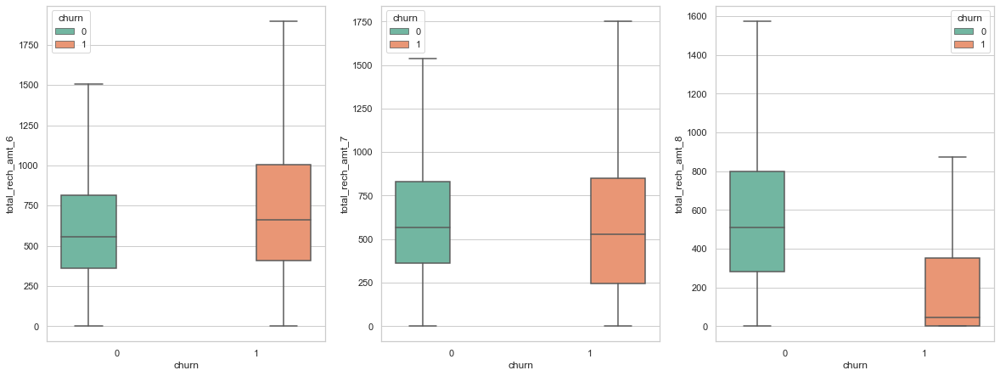

In [40]:
#Calling the function : Plotting total_rech_amt for 6,7,8th month
plot_box(hvc, 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8')

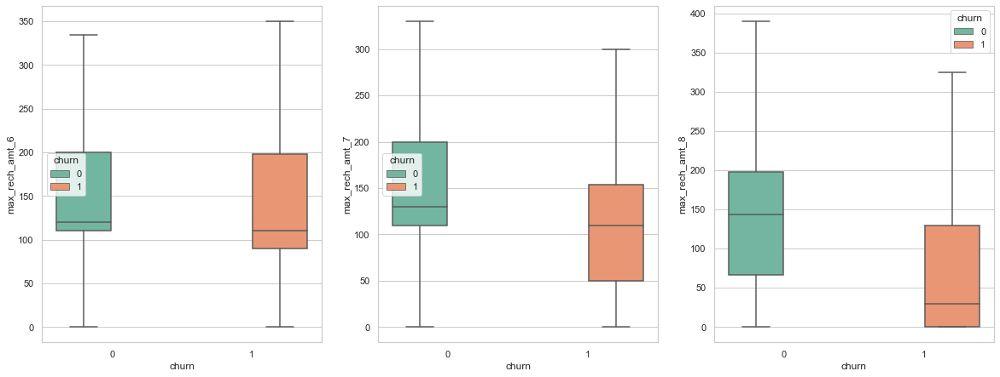

In [41]:
#Calling the function : Plotting last day recharge amount for 6,7,8th month
plot_box(hvc, 'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8')

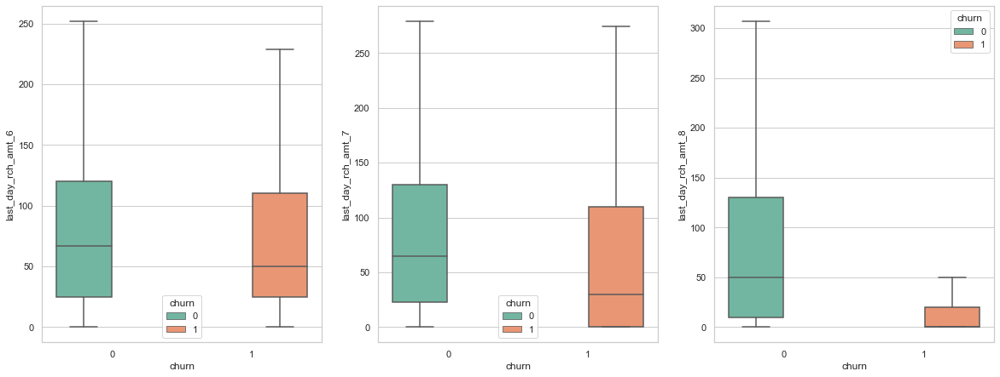

In [42]:
#Calling the function : Plotting max_rech_amt for 6,7,8th month
plot_box(hvc, 'last_day_rch_amt_6', 'last_day_rch_amt_7', 'last_day_rch_amt_8')

In [43]:
# Lets find out description
hvc.loc[:,['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
                        'max_rech_amt_6','max_rech_amt_7','max_rech_amt_8']].describe()

,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8
count,29953.00,29953.00,29953.00,29953.00,29953.00,29953.00
mean,661.13,660.93,584.71,169.35,172.28,160.22
std,561.33,582.75,611.47,175.42,181.50,173.30
min,0.00,0.00,0.00,0.00,0.00,0.00
25%,360.00,352.00,250.00,110.00,110.00,50.00
50%,566.00,562.00,491.00,120.00,128.00,130.00
75%,834.00,832.00,776.00,200.00,200.00,198.00
max,35190.00,40335.00,45320.00,4010.00,4010.00,4449.00


In [44]:
#Lets find out column name with 2g & 3g
in_og_2g_3g_usage = hvc.columns[hvc.columns.str.contains('2g|3g',regex=True)]

In [45]:
in_og_2g_3g_usage

Index(['count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'vol_2g_mb_6',
       'vol_2g_mb_7', 'vol_2g_mb_8', 'vol_3g_mb_6', 'vol_3g_mb_7',
       'vol_3g_mb_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6',
       'arpu_2g_7', 'arpu_2g_8', 'monthly_2g_6', 'monthly_2g_7',
       'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8',
       'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6',
       'sachet_3g_7', 'sachet_3g_8', 'vbc_3g_8', 'vbc_3g_7', 'vbc_3g_6',
       'avg_count_rech_2g_av67', 'avg_count_rech_3g_av67',
       'avg_vol_2g_mb_av67', 'avg_vol_3g_mb_av67', 'avg_arpu_3g_av67',
       'avg_arpu_2g_av67', 'avg_monthly_2g_av67', 'avg_sachet_2g_av67',
       'avg_monthly_3g_av67', 'avg_sachet_3g_av67', 'avg_vbc_3g_av67'],
      dtype='object')

In [46]:
# Saperating volume 2g-3g columns for later use
vol_2g3g = ['vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8', 'vol_3g_mb_6','vol_3g_mb_7', 'vol_3g_mb_8']

# Saperating monthly 2g-3g columns for later use
month_2g3g = ['monthly_2g_6', 'monthly_2g_7','monthly_2g_8','monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8']

# Saperating volume based cost customer 2g-3g columns
vbc_2g3g = ['vbc_3g_8', 'vbc_3g_7', 'vbc_3g_6']

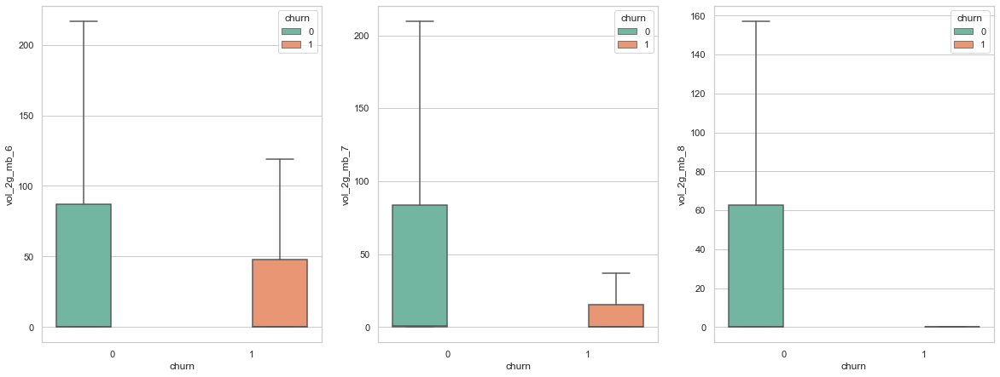

In [47]:
#Calling the function : Plotting volumne of 2G usgae for 6,7,8th month
plot_box(hvc, 'vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8')

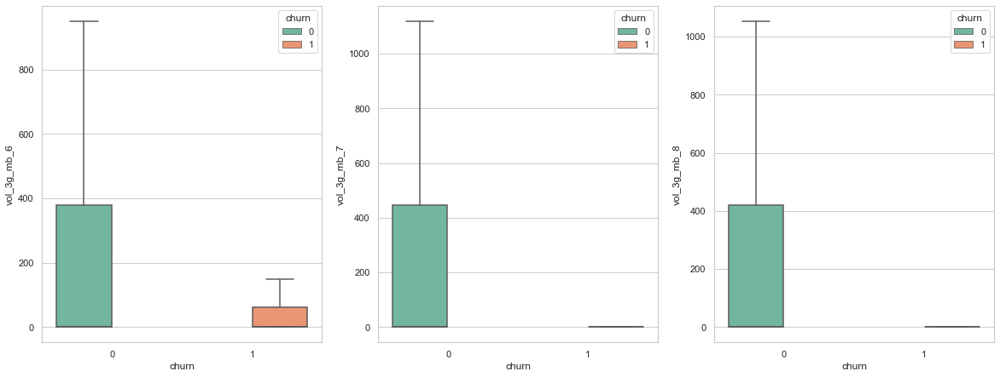

In [48]:
#Calling the function : Plotting volumne of 3G usgae for 6,7,8th month
plot_box(hvc, 'vol_3g_mb_6', 'vol_3g_mb_7', 'vol_3g_mb_8')

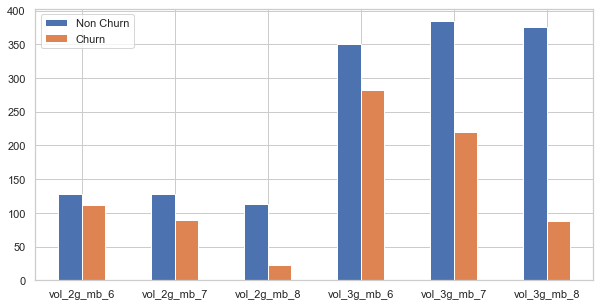

,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8
Non Churn,127.80,128.21,113.18,350.20,383.85,375.18
Churn,112.11,90.03,23.23,282.06,220.01,87.69


In [49]:
#Lets see the mean value
mean_bar_chart(hvc,vol_2g3g)

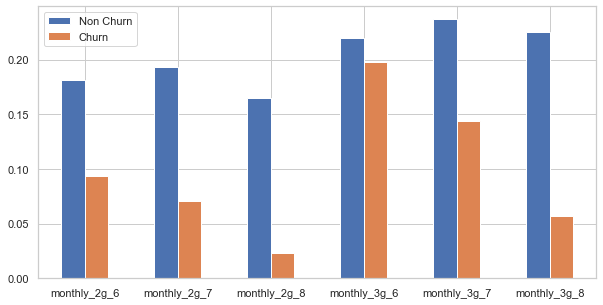

,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8
Non Churn,0.18,0.19,0.17,0.22,0.24,0.22
Churn,0.09,0.07,0.02,0.20,0.14,0.06


In [50]:
#Lets see the mean value
mean_bar_chart(hvc,month_2g3g)

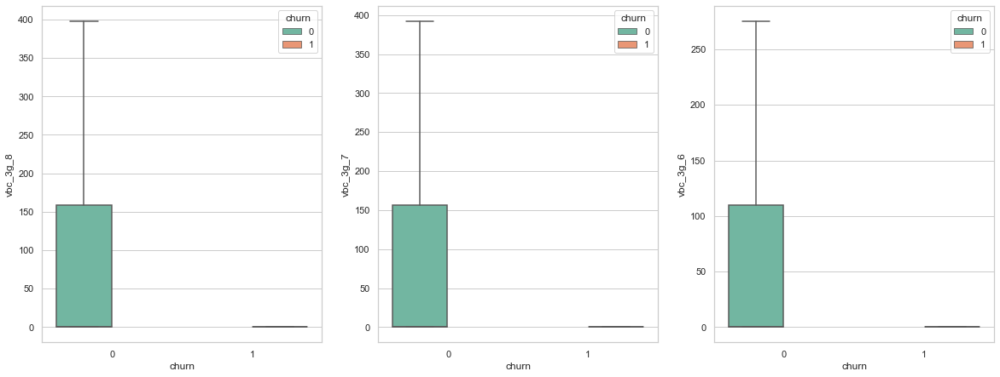

In [51]:
#Calling the function : Plotting vbc 3G usgae for 6,7,8th month
plot_box(hvc, 'vbc_3g_8', 'vbc_3g_7', 'vbc_3g_6')

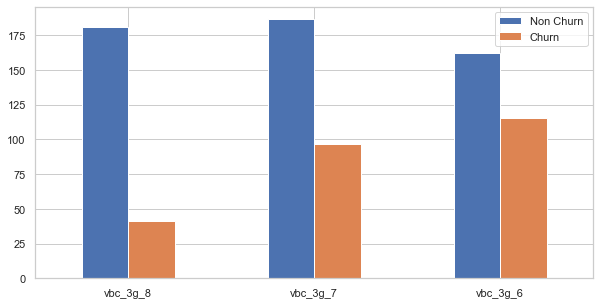

,vbc_3g_8,vbc_3g_7,vbc_3g_6
Non Churn,180.62,186.37,162.56
Churn,40.94,96.34,115.46


In [52]:
#Lets see the mean value
mean_bar_chart(hvc,vbc_2g3g)

In [53]:
hvc.shape

(29953, 211)

In [54]:
#Fetching column names if it contains 'mou'
min_cols = hvc.columns[hvc.columns.str.contains('mou')]
min_cols

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7',
       'roam_ic_mou_8', 'roam_og_mou_6',
       ...
       'avg_loc_ic_t2m_mou_av67', 'avg_loc_ic_t2f_mou_av67',
       'avg_loc_ic_mou_av67', 'avg_std_ic_t2t_mou_av67',
       'avg_std_ic_t2m_mou_av67', 'avg_std_ic_t2f_mou_av67',
       'avg_std_ic_mou_av67', 'avg_total_ic_mou_av67', 'avg_spl_ic_mou_av67',
       'avg_isd_ic_mou_av67'],
      dtype='object', length=108)

In [55]:
#Lets find out column name with in, ic
in_ic = hvc.columns[hvc.columns.str.contains('in|ic',regex=True)]
in_ic

Index(['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'loc_ic_t2t_mou_6',
       'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6',
       'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6',
       'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7',
       'loc_ic_mou_8', 'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7',
       'std_ic_t2t_mou_8', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7',
       'std_ic_t2m_mou_8', 'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7',
       'std_ic_t2f_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8',
       'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'spl_ic_mou_6',
       'spl_ic_mou_7', 'spl_ic_mou_8', 'isd_ic_mou_6', 'isd_ic_mou_7',
       'isd_ic_mou_8', 'ic_others_6', 'ic_others_7', 'ic_others_8',
       'avg_roam_ic_mou_av67', 'avg_loc_ic_t2t_mou_av67',
       'avg_loc_ic_t2m_mou_av67', 'avg_loc_ic_t2f_mou_av67',
       'avg_loc_ic_mou_av67', 'avg_std_ic_t2t_mou_av67',
       'avg_std_ic_t2m_mou_av67', 'avg_std_ic

In [56]:
#Separating values for Roaming Incoming Minutes of usage - voice calls
roam_mou =['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8']
#Separating values for same mobile operator local - voice calls
loc_t2t =['loc_ic_t2t_mou_6','loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8']
#Separating values for other mobile operator local - voice calls
loc_t2m=['loc_ic_t2m_mou_6','loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8']
#Separating values for the mobile to fixedline operator local - voice calls
loc_t2f=['loc_ic_t2f_mou_6','loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8']
#Separating values for local Incoming Minutes of usage - voice calls
loc_mou=['loc_ic_mou_6', 'loc_ic_mou_7','loc_ic_mou_8']
#Separating values for same mobile operator std- voice calls
std_t2t=['std_ic_t2t_mou_6', 'std_ic_t2t_mou_7','std_ic_t2t_mou_8']
#Separating values for other mobile operator std - voice calls
std_t2m=['std_ic_t2m_mou_6', 'std_ic_t2m_mou_7','std_ic_t2m_mou_8']
#Separating values for the mobile to fixedline operator std - voice calls
std_t2f=['std_ic_t2f_mou_6', 'std_ic_t2f_mou_7','std_ic_t2f_mou_8']
#Separating values for std Incoming Minutes of usage - voice calls
std_mou=['std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8']
#Separating values for total Incoming Minutes of usage - voice calls
total_mou=['total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8']
#Separating values for Incoming Minutes of usage - special voice calls
spl_mou=['spl_ic_mou_6','spl_ic_mou_7', 'spl_ic_mou_8']
#Separating values for ISD Incoming Minutes of usage -  voice calls
isd_mou=['isd_ic_mou_6', 'isd_ic_mou_7','isd_ic_mou_8']
#Separating values for Other Incoming Minutes of usage -  voice calls
other_mou=['ic_others_6', 'ic_others_7', 'ic_others_8']

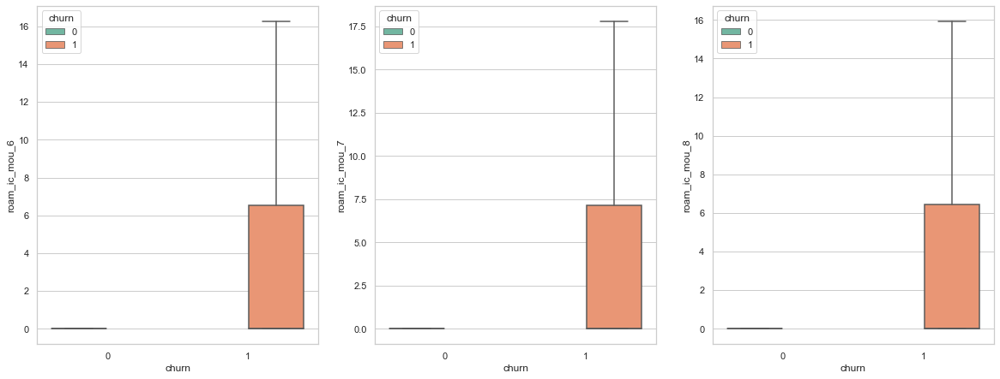

In [57]:
#Calling the function : Plotting Roaming Incoming Minutes of usage - voice calls for 6,7,8th month
plot_box(hvc, 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8')

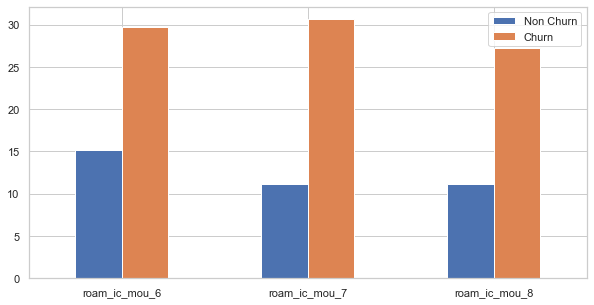

,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8
Non Churn,15.12,11.20,11.21
Churn,29.66,30.61,27.28


In [58]:
#Lets see the mean value
mean_bar_chart(hvc,roam_mou)

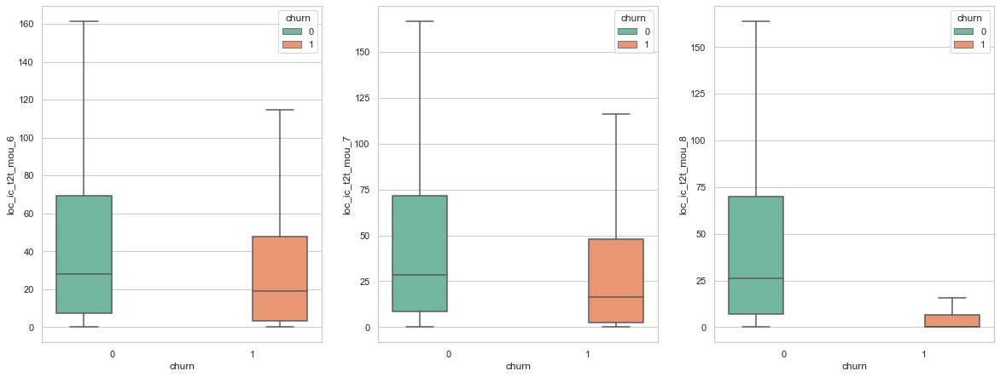

In [59]:
#Calling the function : Plotting same mobile operator local - voice calls for 6,7,8th month
plot_box(hvc, 'loc_ic_t2t_mou_6','loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8')

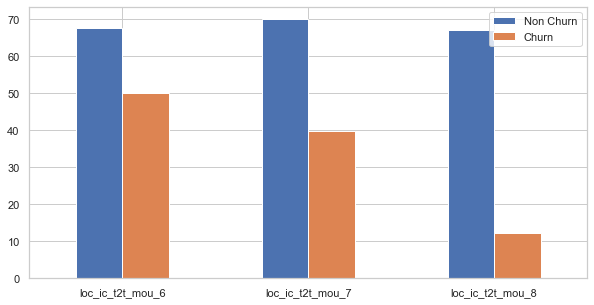

,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8
Non Churn,67.81,69.99,67.12
Churn,50.18,39.90,12.24


In [60]:
#Lets see the mean value
mean_bar_chart(hvc,loc_t2t)

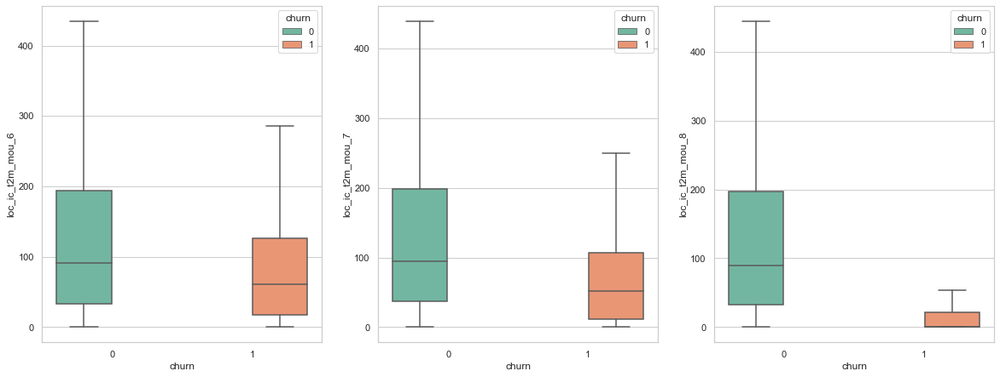

In [61]:
#Calling the function : Plotting for other mobile operator local - voice calls for 6,7,8th month
plot_box(hvc, 'loc_ic_t2m_mou_6','loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8')

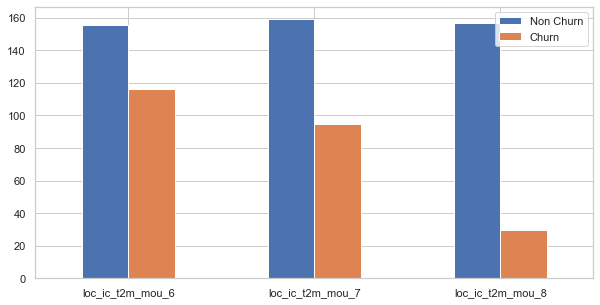

,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8
Non Churn,155.64,158.83,156.59
Churn,115.97,94.79,29.93


In [62]:
#Lets see the mean value
mean_bar_chart(hvc,loc_t2m)

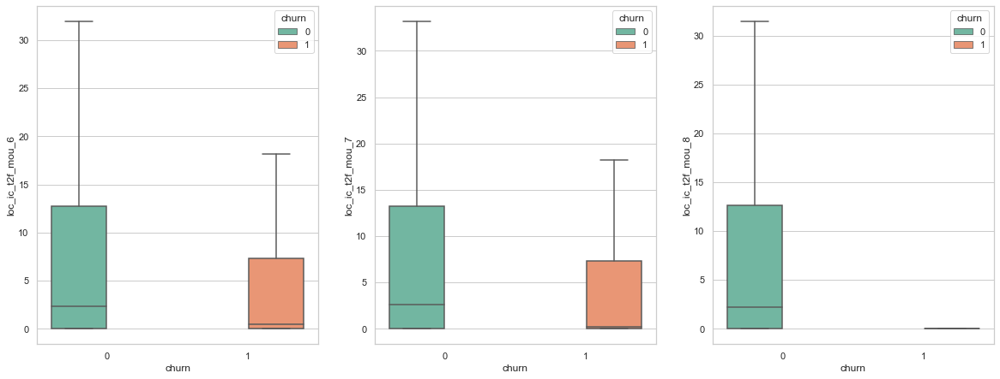

In [63]:
#Calling the function : Plotting for the mobile to fixedline operator local - voice calls for 6,7,8th month
plot_box(hvc, 'loc_ic_t2f_mou_6','loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8')

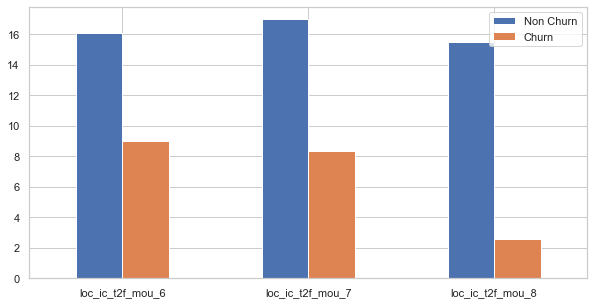

,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8
Non Churn,16.08,16.97,15.46
Churn,9.02,8.34,2.55


In [64]:
#Lets see the mean value
mean_bar_chart(hvc,loc_t2f)

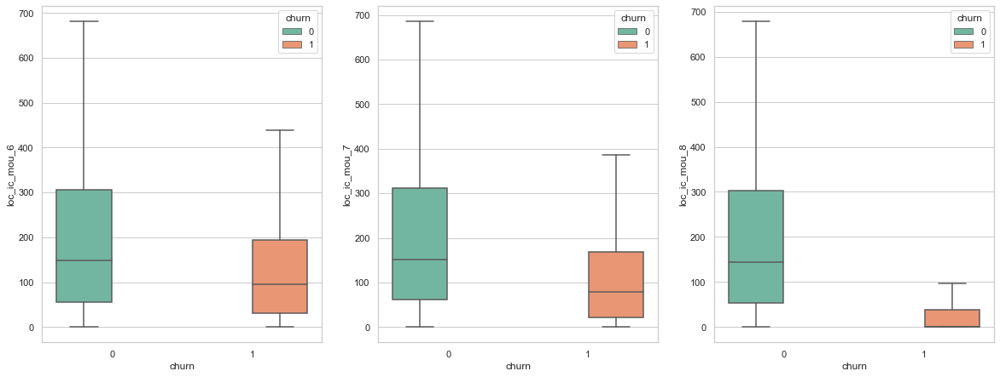

In [65]:
#Calling the function : Plotting for local Incoming Minutes of usage - voice callse for 6,7,8th month
plot_box(hvc, 'loc_ic_mou_6', 'loc_ic_mou_7','loc_ic_mou_8')

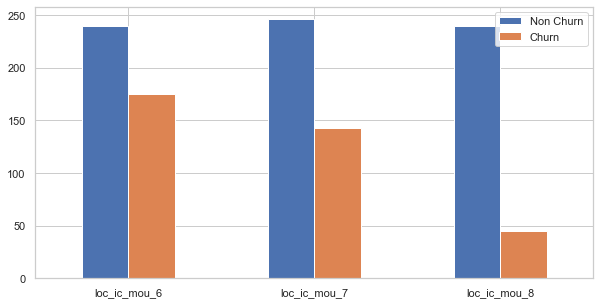

,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8
Non Churn,239.54,245.80,239.19
Churn,175.17,143.03,44.73


In [66]:
#Lets see the mean value
mean_bar_chart(hvc,loc_mou)

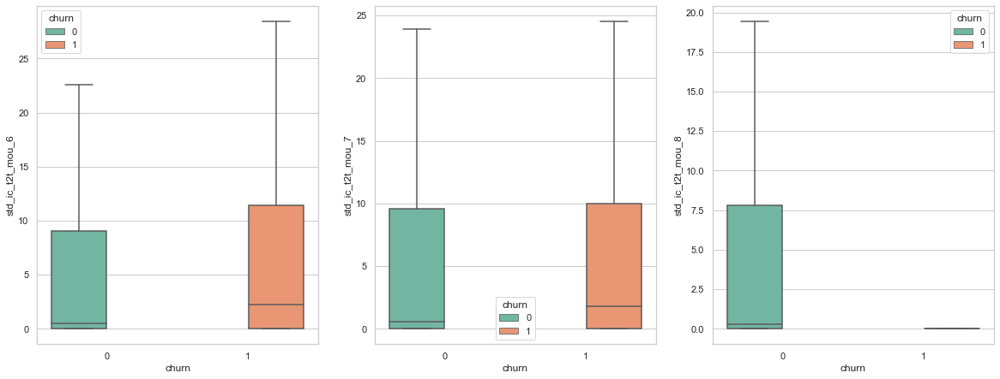

In [67]:
#Calling the function : Plotting for same mobile operator std- voice calls for 6,7,8th month
plot_box(hvc, 'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7','std_ic_t2t_mou_8')

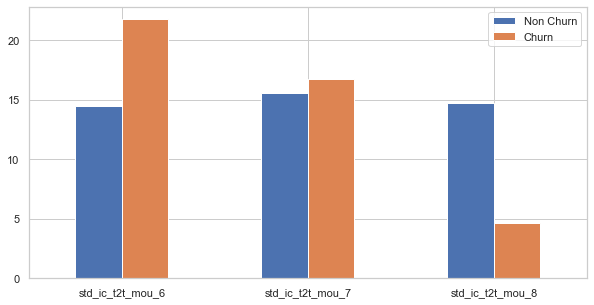

,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8
Non Churn,14.48,15.52,14.74
Churn,21.72,16.70,4.61


In [68]:
#Lets see the mean value
mean_bar_chart(hvc,std_t2t)

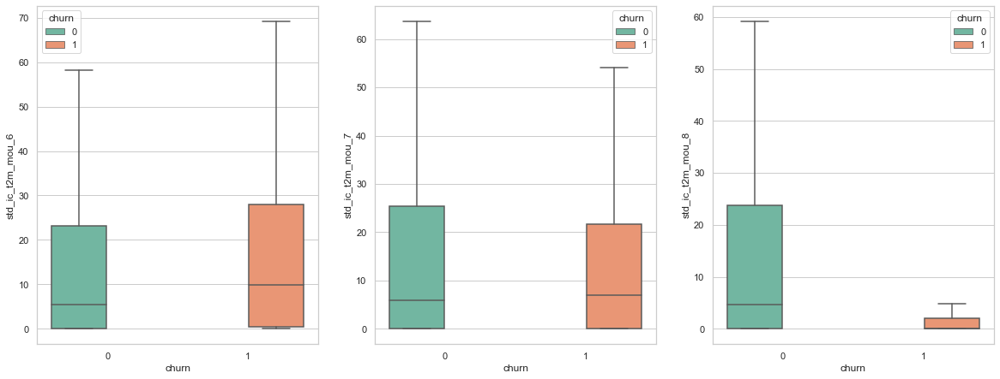

In [69]:
#Calling the function : Plotting other mobile operator std - voice calls for 6,7,8th month
plot_box(hvc, 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7','std_ic_t2m_mou_8')

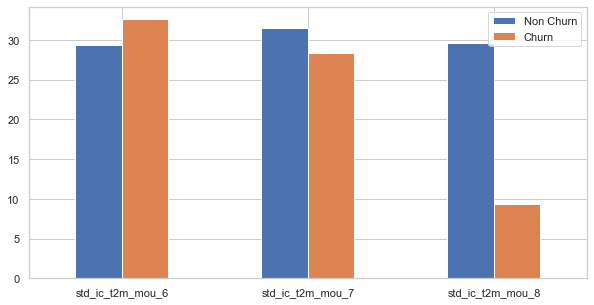

,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8
Non Churn,29.32,31.47,29.56
Churn,32.57,28.34,9.37


In [70]:
#Lets see the mean value
mean_bar_chart(hvc,std_t2m)

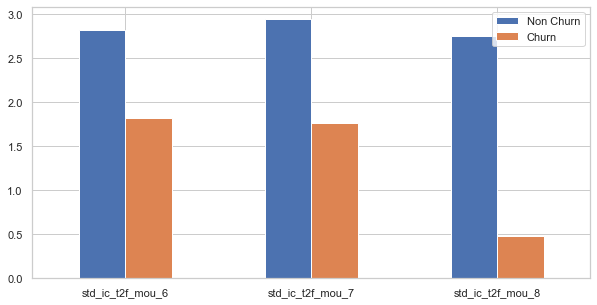

,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8
Non Churn,2.82,2.94,2.75
Churn,1.82,1.76,0.48


In [71]:
#Lets see the mean value
mean_bar_chart(hvc,std_t2f)

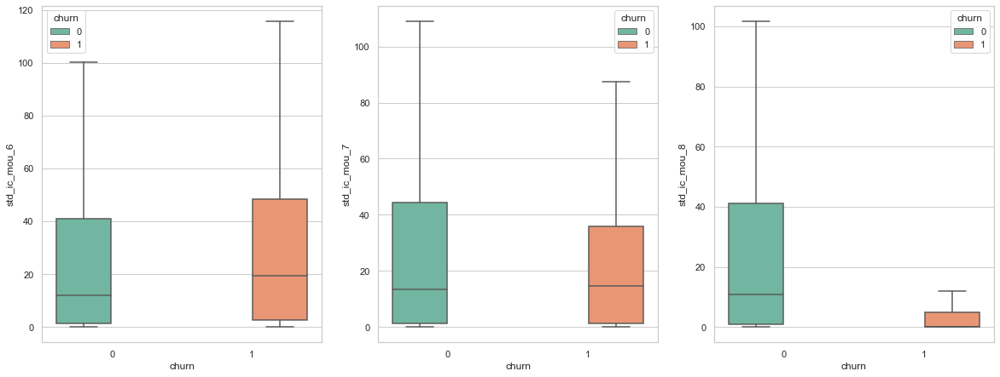

In [72]:
#Calling the function : Plotting for std Incoming Minutes of usage - voice calls for 6,7,8th month
plot_box(hvc, 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8')

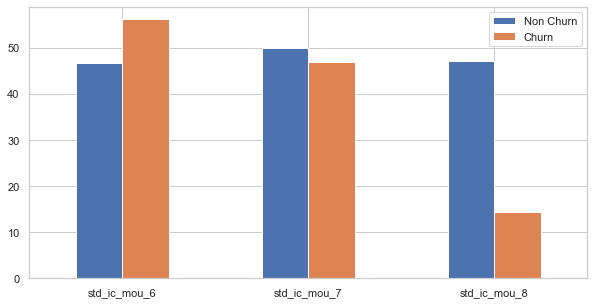

,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8
Non Churn,46.63,49.93,47.06
Churn,56.12,46.81,14.46


In [73]:
#Lets see the mean value
mean_bar_chart(hvc,std_mou)

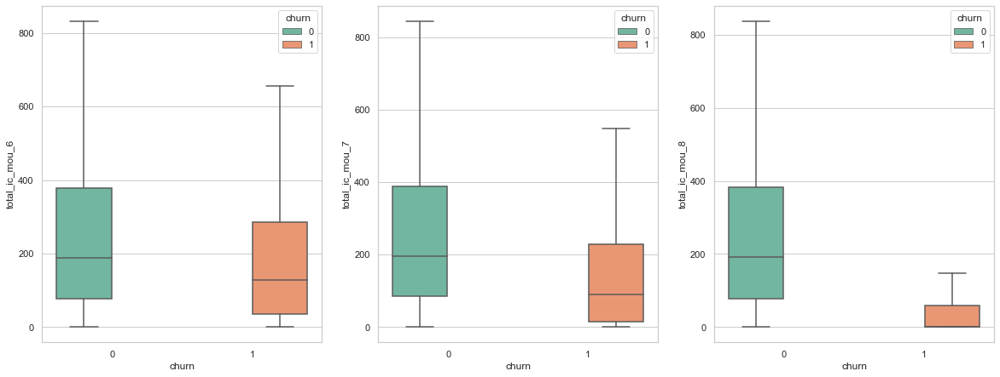

In [74]:
#Calling the function : Plotting for total Incoming Minutes of usage - voice calls for 6,7,8th month
plot_box(hvc,'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8')

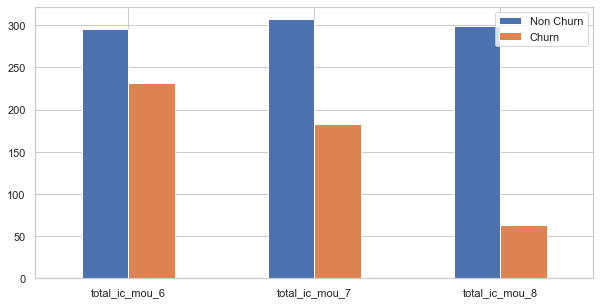

,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8
Non Churn,295.29,306.99,299.22
Churn,231.61,183.28,63.54


In [75]:
#Lets see the mean value
mean_bar_chart(hvc,total_mou)

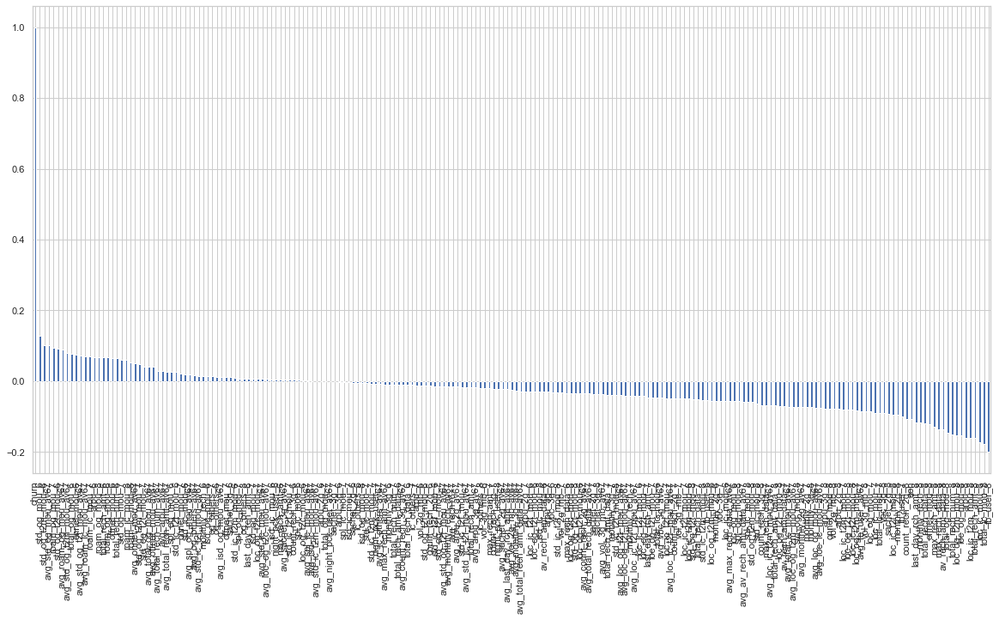

In [76]:
#Get Correlation of "Churn" with other variables
plt.figure(figsize=(20,10))
hvc.corr()['churn'].sort_values(ascending = False).plot(kind='bar')
plt.show()

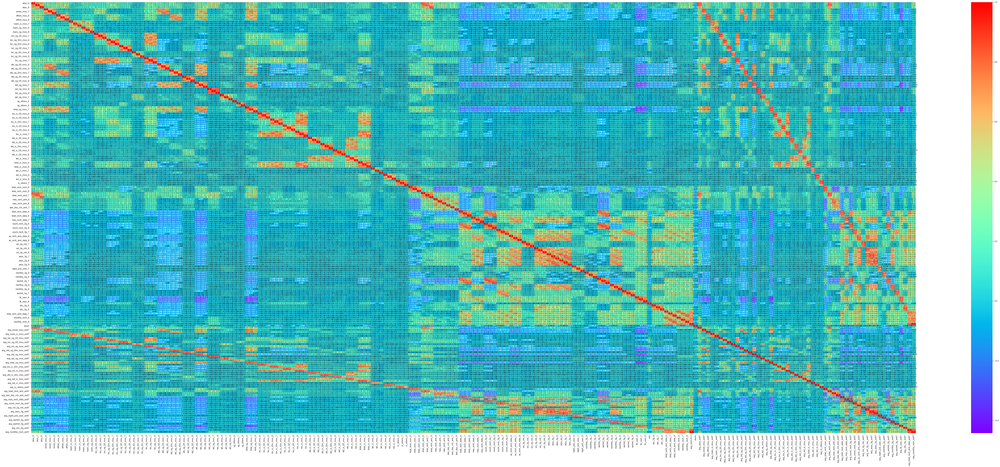

In [77]:
# Plotting correlation plot
plt.figure(figsize=(100,40))
sns.heatmap(hvc.corr(),annot=True,cmap='rainbow')
plt.show()

In [78]:
total_rech_amt_8,arpu_8 - 0.96
std_og_t2t_mou_8,onnet_mou_8 - 0.86
std_og_t2m_mou_8,offnet_mou_8 - 0.85
avg_loc_og_t2t_mou_av67,loc_og_t2t_mou_8 - 0.81
avg_loc_og_t2m_mou_av67,loc_og_t2m_mou_8 - 0.8
avg_loc_og_mou_av67,loc_og_mou_8 - 0.82
total_og_mou_8,std_og_mou_8 - 0.85
avg_isd_og_mou_av67,isd_og_mou_8 - 0.95
avg_monthly_rech_av67,avg_total_rech,amt_data_av67 - 0.93
avg_arpu_2g_av67,avg_monthly_3g_av67 - 0.86
avg_arpu_3g_av67,avg_monthly_3g_av67 - 0.85
avg_count_rech_3g_av67, avg_sachet_3g_av67 - 0.86
avg_count_rech_2g_av67, avg_monthly_2g_av67 - 0.99
avg_total_rech_data_av67, avg_sachet_2g_av67 - 0.91
avg_rech+6+7, avg_monthly_rech_av67 - 1
avg_rech+6+7, avg_total_rech_amt_data_av67 - 0.93
avg_arpu_3g_av67, avg_arpu_2g_av67 - 0.95
avg_vol_3g_mb_av67, avg_arpu_2g_av67 - 0.8
avg_vol_3g_mb_av67, avg_arpu_3g_av67 - 0.81
avg_av_rech_amt_data_av67, avg_arpu_2g_av67 - 0.85
avg_av_rech_amt_data_av67, avg_arpu_3g_av67 - 0.83
avg_av_rech_amt_data_av67, avg_vol_3g_mb_av67 - 0.81
avg_max_rech_data_av67, 14th - 0.82
avg_std_ic_t2m_mou_av67 , 27th - 0.82
avg_loc_ic_mou_av67, 26th - 0.89
avg_loc_ic_t2m_mou_av67, 31 - 0.84
avg_std_og_mou_av67, 35th - 0.83
avg_offnet_mou_av67, 41th - 0.84
avg_onnet_mou_av67, 42 - 0.86
avg_arpu_av67, 21ts - 0.98
total_rech_amt_data_8,monthly_rech_8 - 0.94
arpu_2g_8, 61 - 0.85
arpu_3g_8, 61 - 0.84
arpu_3g_8,65 - 0.94
av_rech_amt_data_8, 65,66 - 0.84,0.81
count_rech_3g_8, 60 - 0.88
count_rech_2g_8,62 - 0.99
max_rech_data_8,69 - 0.8
total_rech_data_8, 62,71 - 0.9,0.91
total_ic_mou_8, 26 - 0.81
loc_ic_mou_8, 31,81 - 0.82,0.9
std_ic_t2t_mou_8, 82 - 0.85
loc_ic_t2m_mou_8, 86 - 0.85
isd_og_mou_8, 38 - 0.95
std_og_mou_8, 90 - 0.85
loc_og_mou_8, 43 - 0.82
loc_og_t2m_mou_8, 46 - 0.8
loc_og_t2t_mou_8, 47 - 0.81

SyntaxError: invalid syntax (<ipython-input-78-be10acf5d8fb>, line 23)

In [ ]:
cols = []

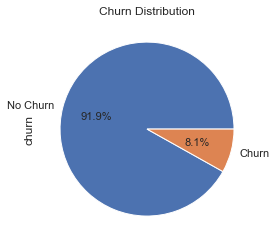

In [79]:
#Churn Distribution
ax = (hvc['churn'].value_counts()*100.0 /len(hvc)).plot.pie(autopct='%.1f%%', labels = ['No Churn', 'Churn'],figsize =(4,4), fontsize = 11)                                                                           

#Setting y label
#ax.set_ylabel('Churn',fontsize = 12)

#Setting Title
ax.set_title('Churn Distribution', fontsize = 12)
plt.show()

In [80]:
cols = hvc.filter(regex=('_6|_7')).columns
#drop these columns as mentioned
hvc.drop(cols,axis=1,inplace=True)

In [81]:
X = hvc.drop('churn',axis=1)
y = hvc.churn

In [82]:
#splitting data to train and test
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [83]:
print("Dimension of X_train:", X_train.shape)
print("Dimension of X_test:", X_test.shape)

Dimension of X_train: (23962, 106)
Dimension of X_test: (5991, 106)


In [84]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=0)
X_smote, y_smote = smote.fit_sample(X_train, y_train)

In [85]:
y_smote.value_counts(normalize=True)

1   0.50
0   0.50
Name: churn, dtype: float64

In [86]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_smote = scaler.fit_transform(X_smote)
X_test = scaler.transform(X_test)

In [87]:
#RFE
from sklearn.feature_selection import RFE
logreg = LogisticRegression()
rfe = RFE(logreg, 30)             
rfe = rfe.fit(X_smote, y_smote)

In [88]:
X_smote = pd.DataFrame(X_smote)
y_smote = pd.DataFrame(y_smote)
X_smote.columns = X.columns
X_smote.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8,isd_og_mou_8,spl_og_mou_8,og_others_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,total_rech_data_8,max_rech_data_8,count_rech_2g_8,count_rech_3g_8,av_rech_amt_data_8,vol_2g_mb_8,vol_3g_mb_8,arpu_3g_8,arpu_2g_8,night_pck_user_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,fb_user_8,aon,vbc_3g_8,total_rech_amt_data_8,monthly_rech_8,avg_rech+6+7,avg_arpu_av67,avg_onnet_mou_av67,avg_offnet_mou_av67,avg_roam_ic_mou_av67,avg_roam_og_mou_av67,avg_loc_og_t2t_mou_av67,avg_loc_og_t2m_mou_av67,avg_loc_og_t2f_mou_av67,avg_loc_og_t2c_mou_av67,avg_loc_og_mou_av67,avg_std_og_t2t_mou_av67,avg_std_og_t2m_mou_av67,avg_std_og_t2f_mou_av67,avg_std_og_mou_av67,avg_isd_og_mou_av67,avg_spl_og_mou_av67,avg_og_others_av67,avg_total_og_mou_av67,avg_loc_ic_t2t_mou_av67,avg_loc_ic_t2m_mou_av67,avg_loc_ic_t2f_mou_av67,avg_loc_ic_mou_av67,avg_std_ic_t2t_mou_av67,avg_std_ic_t2m_mou_av67,avg_std_ic_t2f_mou_av67,avg_std_ic_mou_av67,avg_total_ic_mou_av67,avg_spl_ic_mou_av67,avg_isd_ic_mou_av67,avg_ic_others_av67,avg_total_rech_num_av67,avg_total_rech_amt_av67,avg_max_rech_amt_av67,avg_last_day_rch_amt_av67,avg_total_rech_data_av67,avg_max_rech_data_av67,avg_count_rech_2g_av67,avg_count_rech_3g_av67,avg_av_rech_amt_data_av67,avg_vol_2g_mb_av67,avg_vol_3g_mb_av67,avg_arpu_3g_av67,avg_arpu_2g_av67,avg_night_pck_user_av67,avg_monthly_2g_av67,avg_sachet_2g_av67,avg_monthly_3g_av67,avg_sachet_3g_av67,avg_fb_user_av67,avg_vbc_3g_av67,avg_total_rech_amt_data_av67,avg_monthly_rech_av67
0,0.17,-0.27,0.19,-0.20,-0.23,-0.06,0.41,3.44,-0.23,0.41,-0.25,-0.09,-0.12,-0.22,-0.04,-0.13,-0.02,-0.00,-0.22,0.24,0.42,0.12,1.60,1.25,0.15,1.75,0.72,-0.19,-0.14,-0.09,-0.54,0.31,0.79,1.50,-0.02,0.52,0.11,-0.27,0.11,1.13,-0.30,-0.30,-0.31,-0.09,-0.27,0.18,-0.27,-0.14,1.48,1.30,-0.31,-0.15,-0.01,-0.49,-0.50,-0.56,-0.42,0.31,-0.03,-0.32,-0.10,0.10,0.10,-0.25,-0.45,-0.41,-0.12,-0.59,-0.07,-0.12,-0.14,-0.66,-0.39,-0.23,0.12,-0.33,0.37,0.23,-0.14,0.36,-0.13,-0.32,-0.18,-0.10,-0.80,-0.58,0.57,1.41,-0.23,0.60,-0.09,-0.38,0.06,0.77,-0.40,-0.41,-0.42,-0.14,1.15,-0.25,-0.39,-0.23,1.24,-0.40,-0.28,-0.49
1,0.03,0.22,1.04,-0.20,-0.23,-0.23,-0.44,-0.24,-0.23,-0.44,0.40,1.57,-0.12,1.30,-0.04,-0.29,-0.02,0.89,-0.31,-0.51,-0.27,-0.54,-0.17,-0.21,-0.10,-0.25,-0.57,-0.19,-0.14,-0.09,-0.42,-0.03,0.06,0.54,-0.43,-0.50,-0.38,-0.27,-0.47,-0.27,-0.30,-0.30,-0.31,-0.09,-0.27,-0.32,-0.27,-0.14,-0.70,0.55,-0.31,-0.22,-0.21,-0.40,-0.14,-0.53,1.53,-0.24,-0.29,-0.29,-0.46,-0.21,-0.04,-0.49,-0.41,1.94,-0.16,1.10,-0.07,-0.33,-0.14,0.82,-0.41,-0.64,-0.34,-0.69,-0.21,-0.29,-0.16,-0.34,-0.73,-0.32,-0.18,-0.10,-0.56,-0.12,-0.23,0.22,-0.61,-0.68,-0.53,-0.38,-0.69,-0.42,-0.40,-0.41,-0.44,-0.14,-0.40,-0.47,-0.39,-0.23,-1.03,-0.40,-0.39,-0.40
2,0.19,0.47,0.45,-0.20,-0.23,0.01,0.09,-0.24,-0.23,0.05,0.57,0.56,-0.12,0.74,-0.04,0.93,-0.02,0.68,0.07,0.08,-0.27,0.05,-0.15,-0.20,-0.10,-0.24,-0.07,-0.19,-0.14,-0.09,0.64,0.21,0.06,-0.27,-0.43,-0.50,-0.38,-0.27,-0.47,-0.27,-0.30,-0.30,-0.31,-0.09,-0.27,-0.32,-0.27,-0.14,-0.70,-0.97,-0.31,-0.22,-0.12,-0.46,-0.21,0.19,-0.07,-0.24,-0.29,-0.04,-0.31,-0.22,-0.17,-0.24,0.25,0.13,-0.16,0.26,-0.07,-0.18,0.65,0.14,0.07,-0.16,-0.34,-0.13,-0.15,-0.32,-0.16,-0.33,-0.26,-0.32,-0.18,-0.10,0.69,-0.26,-0.69,-0.69,-0.61,-0.68,-0.53,-0.38,-0.69,-0.42,-0.40,-0.41,-0.44,-0.14,-0.40,-0.47,-0.39,-0.23,-1.03,-0.40,-0.39,-0.46
3,0.10,0.04,-0.17,-0.20,-0.23,0.80,-0.01,0.39,-0.23,0.49,-0.33,-0.17,0.22,-0.32,-0.04,-0.29,-0.02,-0.05,1.64,-0.32,0.04,0.57,-0.17,0.23,-0.10,0.07,0.48,-0.19,-0.14,-0.09,-0.54,0.07,0.30,0.80,-0.43,-0.50,-0.38,-0.27,-0.47,-0.27,-0.30,-0.30,-0.31,-0.09,-0.27,-0.32,

In [133]:
y = pd.DataFrame(y)
y_smote.columns=y.columns

In [137]:
y.head()

,churn
0,1
7,1
8,0
21,0
23,0


In [136]:
y_smote.describe()

,churn
count,44054.00
mean,0.50
std,0.50
min,0.00
25%,0.00
50%,0.50
75%,1.00
max,1.00


In [89]:
RFE = pd.DataFrame()
RFE['features'] = X_smote.columns
RFE['support'] = rfe.support_
RFE['ranking'] = rfe.ranking_
RFE.sort_values('ranking')

,features,support,ranking
52,monthly_rech_8,True,1
56,avg_offnet_mou_av67,True,1
55,avg_onnet_mou_av67,True,1
54,avg_arpu_av67,True,1
26,total_ic_mou_8,True,1
27,spl_ic_mou_8,True,1
48,fb_user_8,True,1
21,loc_ic_mou_8,True,1
30,total_rech_num_8,True,1
47,sachet_3g_8,True,1


In [90]:
col = X_smote.columns[rfe.support_]

In [91]:
col

Index(['offnet_mou_8', 'roam_og_mou_8', 'std_og_t2m_mou_8', 'loc_ic_mou_8',
       'total_ic_mou_8', 'spl_ic_mou_8', 'total_rech_num_8',
       'total_rech_amt_8', 'last_day_rch_amt_8', 'total_rech_data_8',
       'count_rech_2g_8', 'count_rech_3g_8', 'monthly_2g_8', 'sachet_2g_8',
       'monthly_3g_8', 'sachet_3g_8', 'fb_user_8', 'monthly_rech_8',
       'avg_arpu_av67', 'avg_onnet_mou_av67', 'avg_offnet_mou_av67',
       'avg_total_og_mou_av67', 'avg_loc_ic_t2m_mou_av67',
       'avg_loc_ic_mou_av67', 'avg_std_ic_mou_av67', 'avg_total_ic_mou_av67',
       'avg_isd_ic_mou_av67', 'avg_total_rech_data_av67',
       'avg_av_rech_amt_data_av67', 'avg_arpu_2g_av67'],
      dtype='object')

In [92]:
#Logistic Regression
import statsmodels.api as sm
X_smote_sm = sm.add_constant(X_smote[col])
logml = sm.GLM(y_smote,X_smote_sm, family = sm.families.Binomial())
res = logml.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                44054
Model:                            GLM   Df Residuals:                    44024
Model Family:                Binomial   Df Model:                           29
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 02 Feb 2021   Deviance:                          nan
Time:                        17:07:41   Pearson chi2:                 5.36e+19
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                      1.048e+15    3.2e+05   3.28e+09      0.000    1.05e+15    1.05e+15
offnet_mou_8              -2.118e+14   9.29e+05  -2.28e+08      0.000   -2.12e+14   -2.12e+14
roam_og_mou_8              2.552e+14   4.31e+05   5.92e+08      0.000    2.55e+14    2.55e+14
std_og_t2m_mou_8           1.839e+14   7.74e+05   2.38e+08      0.000    1.84e+14    1.84e+14
loc_ic_mou_8              -1.977e+14   1.08e+06  -1.83e+08      0.000   -1.98e+14   -1.98e+14
total_ic_mou_8            -2.704e+14   1.06e+06  -2.56e+08      0.000    -2.7e+14    -2.7e+14
spl_ic_mou_8              -1.371e+14   3.26e+05   -4.2e+08      0.000   -1.37e+14   -1.37e+14
total_rech_num_8          -3.704e+14   4.62e+05  -8.01e+08      0.000    -3.7e+14    -3.7e+14
total_rech_amt_8          -1.635e+14   7.26e+05  -2.25e+08      0.000   -1.64e+14   -1.64e+14
last_day_rch_amt_8        -2.636e+14   3.93e+05   -6.7e+08      0.000   -2.64e+14   -2.64e+14
total_rech_data_8          1.498e+27   3.28e+19   4.57e+07      0.000     1.5e+27     1.5e+27
count_rech_2g_8           -1.237e+27    2.7e+19  -4.57e+07      0.000   -1.24e+27   -1.24e+27
count_rech_3g_8           -6.433e+26   1.41e+19  -4.57e+07      0.000   -6.43e+26   -6.43e+26
monthly_2g_8              -1.721e+15   6.98e+05  -2.47e+09      0.000   -1.72e+15   -1.72e+15
sachet_2g_8               -1.005e+16   3.93e+06  -2.56e+09      0.000   -1.01e+16   -1.01e+16
monthly_3g_8              -2.838e+15   1.43e+06  -1.98e+09      0.000   -2.84e+15   -2.84e+15
sachet_3g_8               -5.093e+15   2.59e+06  -1.97e+09      0.000   -5.09e+15   -5.09e+15
fb_user_8                 -4.458e+14   5.52e+05  -8.08e+08      0.000   -4.46e+14   -4.46e+14
monthly_rech_8             1.316e+14   6.72e+05   1.96e+08      0.000    1.32e+14    1.32e+14
avg_arpu_av67              1.964e+13   5.54e+05   3.54e+07      0.000    1.96e+13    1.96e+13
avg_onnet_mou_av67        -4.755e+14   1.76e+06   -2.7e+08      0.000   -4.75e+14   -4.75e+14
avg_offnet_mou_av67       -7.375e+14   1.93e+06  -3.82e+08      0.000   -7.38e+14   -7.38e+14
avg_total_og_mou_av67      8.545e+14   2.53e+06   3.37e+08      0.000    8.54e+14    8.54e+14
avg_loc_ic_t2m_mou_av67    8.907e+12   6.92e+05   1.29e+07      0.000    8.91e+12    8.91e+12
avg_loc_ic_mou_av67       -1.467e+15   2.86e+06  -5.13e+08      0.000   -1.47e+15   -1.47e+15
avg_std_ic_mou_av67       -6.815e+14   1.43e+06  -4.76e+08      0.000   -6.81e+14   -6.81e+14
avg_total_ic_mou_av67      1.608e+15   3.37e+06   4.77e+08      0.000    1.61e+15    1.61e+15
avg_isd_ic_mou_av67       -3.164e+14   7.56e+05  -4.19e+08      0.000   -3.16e+14   -3.16e+14
avg_total_rech_data_av67   2.903e+12   4.83e+05   6.01e+06      0.000     2.9e+12     2.9e+12
avg_av_rech_amt_data_av67  -1.64e+14   8.53e+05  -1.92e+08      0.000   -1.

In [93]:
#isd_og_mou_8,std_ic_t2f_mou_8,total_rech_amt_data_8 - high p
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = X_smote[col].columns
vif['VIF'] = [variance_inflation_factor(X_smote[col].values, i) for i in range(X_smote[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,total_rech_data_8,inf
10,count_rech_2g_8,inf
11,count_rech_3g_8,inf
13,sachet_2g_8,150.93
25,avg_total_ic_mou_av67,111.25
23,avg_loc_ic_mou_av67,80.17
15,sachet_3g_8,65.39
21,avg_total_og_mou_av67,62.71
20,avg_offnet_mou_av67,36.38
19,avg_onnet_mou_av67,30.22


In [94]:
col = col.drop(['total_rech_data_8','count_rech_2g_8','count_rech_3g_8'],1)

In [95]:
X_smote_sm = sm.add_constant(X_smote[col])
logml = sm.GLM(y_smote,X_smote_sm, family = sm.families.Binomial())
res = logml.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                44054
Model:                            GLM   Df Residuals:                    44026
Model Family:                Binomial   Df Model:                           27
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16534.
Date:                Tue, 02 Feb 2021   Deviance:                       33067.
Time:                        17:17:07   Pearson chi2:                 1.87e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.3952      0.018    -22.578      0.000      -0.430      -0.361
offnet_mou_8                 -0.9909      0.063    -15.614      0.000      -1.115      -0.866
roam_og_mou_8                 0.3471      0.021     16.484      0.000       0.306       0.388
std_og_t2m_mou_8              0.6130      0.052     11.877      0.000       0.512       0.714
loc_ic_mou_8                 -1.0080      0.085    -11.860      0.000      -1.175      -0.841
total_ic_mou_8               -0.7599      0.072    -10.598      0.000      -0.900      -0.619
spl_ic_mou_8                 -0.3760      0.023    -16.685      0.000      -0.420      -0.332
total_rech_num_8             -0.3285      0.022    -14.739      0.000      -0.372      -0.285
total_rech_amt_8             -0.5736      0.041    -13.955      0.000      -0.654      -0.493
last_day_rch_amt_8           -0.6176      0.024    -25.755      0.000      -0.665      -0.571
monthly_2g_8                 -0.9073      0.034    -26.661      0.000      -0.974      -0.841
sachet_2g_8                  -1.1647      0.036    -32.028      0.000      -1.236      -1.093
monthly_3g_8                 -0.8948      0.034    -26.520      0.000      -0.961      -0.829
sachet_3g_8                  -0.6595      0.034    -19.643      0.000      -0.725      -0.594
fb_user_8                     0.0502      0.025      2.026      0.043       0.002       0.099
monthly_rech_8                0.8656      0.038     22.899      0.000       0.792       0.940
avg_arpu_av67                 0.4849      0.036     13.437      0.000       0.414       0.556
avg_onnet_mou_av67            0.4231      0.090      4.700      0.000       0.247       0.599
avg_offnet_mou_av67           0.6671      0.100      6.672      0.000       0.471       0.863
avg_total_og_mou_av67        -0.6173      0.129     -4.792      0.000      -0.870      -0.365
avg_loc_ic_t2m_mou_av67       0.1625      0.051      3.200      0.001       0.063       0.262
avg_loc_ic_mou_av67           3.4256      0.166     20.615      0.000       3.100       3.751
avg_std_ic_mou_av67           1.6059      0.083     19.246      0.000       1.442       1.769
avg_total_ic_mou_av67        -3.5169      0.195    -18.052      0.000      -3.899      -3.135
avg_isd_ic_mou_av67           0.8140      0.042     19.220      0.000       0.731       0.897
avg_total_rech_data_av67      0.5571      0.025     22.691      0.000       0.509       0.605
avg_av_rech_amt_data_av67    -0.6228      0.042    -14.837      0.000      -0.705      -0.541
avg_arpu_2g_av67              0.4981      0.040     12.339      0.000       0.419       0.577
=============================================================================================
"""

In [96]:
vif = pd.DataFrame()
vif['Features'] = X_smote[col].columns
vif['VIF'] = [variance_inflation_factor(X_smote[col].values, i) for i in range(X_smote[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
22,avg_total_ic_mou_av67,110.71
20,avg_loc_ic_mou_av67,79.81
18,avg_total_og_mou_av67,62.69
17,avg_offnet_mou_av67,36.38
16,avg_onnet_mou_av67,30.22
21,avg_std_ic_mou_av67,19.96
3,loc_ic_mou_8,11.39
4,total_ic_mou_8,10.91
0,offnet_mou_8,8.38
25,avg_av_rech_amt_data_av67,7.08


In [97]:
col = col.drop(['avg_total_ic_mou_av67','avg_loc_ic_mou_av67'],1)

In [98]:
X_smote_sm = sm.add_constant(X_smote[col])
logml = sm.GLM(y_smote,X_smote_sm, family = sm.families.Binomial())
res = logml.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                44054
Model:                            GLM   Df Residuals:                    44028
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16769.
Date:                Tue, 02 Feb 2021   Deviance:                       33538.
Time:                        17:22:45   Pearson chi2:                 2.26e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.4104      0.017    -23.669      0.000      -0.444      -0.376
offnet_mou_8                 -1.1003      0.064    -17.303      0.000      -1.225      -0.976
roam_og_mou_8                 0.2248      0.020     11.400      0.000       0.186       0.263
std_og_t2m_mou_8              0.6743      0.052     13.012      0.000       0.573       0.776
loc_ic_mou_8                 -0.8903      0.085    -10.463      0.000      -1.057      -0.724
total_ic_mou_8               -0.8762      0.076    -11.475      0.000      -1.026      -0.727
spl_ic_mou_8                 -0.3823      0.022    -17.043      0.000      -0.426      -0.338
total_rech_num_8             -0.3471      0.022    -15.860      0.000      -0.390      -0.304
total_rech_amt_8             -0.4994      0.039    -12.966      0.000      -0.575      -0.424
last_day_rch_amt_8           -0.5809      0.023    -25.006      0.000      -0.626      -0.535
monthly_2g_8                 -0.9024      0.033    -27.170      0.000      -0.967      -0.837
sachet_2g_8                  -1.1641      0.037    -31.665      0.000      -1.236      -1.092
monthly_3g_8                 -0.8395      0.032    -26.507      0.000      -0.902      -0.777
sachet_3g_8                  -0.6413      0.032    -20.025      0.000      -0.704      -0.578
fb_user_8                     0.0676      0.024      2.776      0.006       0.020       0.115
monthly_rech_8                0.8306      0.039     21.561      0.000       0.755       0.906
avg_arpu_av67                 0.3592      0.033     11.014      0.000       0.295       0.423
avg_onnet_mou_av67            1.3826      0.081     17.006      0.000       1.223       1.542
avg_offnet_mou_av67           1.7244      0.090     19.126      0.000       1.548       1.901
avg_total_og_mou_av67        -1.9960      0.118    -16.978      0.000      -2.226      -1.766
avg_loc_ic_t2m_mou_av67       0.6161      0.031     19.707      0.000       0.555       0.677
avg_std_ic_mou_av67           0.1887      0.025      7.528      0.000       0.140       0.238
avg_isd_ic_mou_av67           0.1149      0.019      6.018      0.000       0.077       0.152
avg_total_rech_data_av67      0.5389      0.024     22.320      0.000       0.492       0.586
avg_av_rech_amt_data_av67    -0.6055      0.041    -14.803      0.000      -0.686      -0.525
avg_arpu_2g_av67              0.5659      0.039     14.500      0.000       0.489       0.642
=============================================================================================
"""

In [99]:
vif = pd.DataFrame()
vif['Features'] = X_smote[col].columns
vif['VIF'] = [variance_inflation_factor(X_smote[col].values, i) for i in range(X_smote[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
18,avg_total_og_mou_av67,48.38
17,avg_offnet_mou_av67,28.55
16,avg_onnet_mou_av67,23.72
4,total_ic_mou_8,10.81
3,loc_ic_mou_8,10.27
0,offnet_mou_8,8.18
23,avg_av_rech_amt_data_av67,7.08
24,avg_arpu_2g_av67,5.95
2,std_og_t2m_mou_8,5.75
7,total_rech_amt_8,5.11


In [100]:
col = col.drop(['avg_total_og_mou_av67','avg_offnet_mou_av67','avg_onnet_mou_av67'],1)

In [101]:
X_smote_sm = sm.add_constant(X_smote[col])
logml = sm.GLM(y_smote,X_smote_sm, family = sm.families.Binomial())
res = logml.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                44054
Model:                            GLM   Df Residuals:                    44031
Model Family:                Binomial   Df Model:                           22
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16978.
Date:                Tue, 02 Feb 2021   Deviance:                       33956.
Time:                        17:24:37   Pearson chi2:                 1.52e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.4310      0.017    -25.098      0.000      -0.465      -0.397
offnet_mou_8                 -0.9449      0.061    -15.604      0.000      -1.064      -0.826
roam_og_mou_8                 0.3878      0.018     21.284      0.000       0.352       0.424
std_og_t2m_mou_8              0.7021      0.051     13.656      0.000       0.601       0.803
loc_ic_mou_8                 -0.9879      0.084    -11.758      0.000      -1.153      -0.823
total_ic_mou_8               -0.8691      0.075    -11.645      0.000      -1.015      -0.723
spl_ic_mou_8                 -0.3799      0.022    -17.093      0.000      -0.423      -0.336
total_rech_num_8             -0.3795      0.022    -17.061      0.000      -0.423      -0.336
total_rech_amt_8             -0.6249      0.039    -16.107      0.000      -0.701      -0.549
last_day_rch_amt_8           -0.5562      0.024    -23.620      0.000      -0.602      -0.510
monthly_2g_8                 -0.8885      0.033    -27.196      0.000      -0.953      -0.824
sachet_2g_8                  -1.1395      0.036    -31.247      0.000      -1.211      -1.068
monthly_3g_8                 -0.7930      0.031    -25.761      0.000      -0.853      -0.733
sachet_3g_8                  -0.6235      0.031    -19.923      0.000      -0.685      -0.562
fb_user_8                     0.0694      0.024      2.874      0.004       0.022       0.117
monthly_rech_8                0.8148      0.037     21.824      0.000       0.742       0.888
avg_arpu_av67                 0.5738      0.025     22.528      0.000       0.524       0.624
avg_loc_ic_t2m_mou_av67       0.6327      0.031     20.320      0.000       0.572       0.694
avg_std_ic_mou_av67           0.1856      0.025      7.511      0.000       0.137       0.234
avg_isd_ic_mou_av67           0.0993      0.017      5.938      0.000       0.066       0.132
avg_total_rech_data_av67      0.5071      0.024     21.209      0.000       0.460       0.554
avg_av_rech_amt_data_av67    -0.6717      0.040    -16.670      0.000      -0.751      -0.593
avg_arpu_2g_av67              0.6110      0.039     15.843      0.000       0.535       0.687
=============================================================================================
"""

In [102]:
vif = pd.DataFrame()
vif['Features'] = X_smote[col].columns
vif['VIF'] = [variance_inflation_factor(X_smote[col].values, i) for i in range(X_smote[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,total_ic_mou_8,10.80
3,loc_ic_mou_8,10.27
0,offnet_mou_8,7.32
20,avg_av_rech_amt_data_av67,6.97
21,avg_arpu_2g_av67,5.90
2,std_og_t2m_mou_8,5.71
7,total_rech_amt_8,4.60
14,monthly_rech_8,4.31
10,sachet_2g_8,2.94
13,fb_user_8,2.64


In [103]:
col = col.drop(['total_ic_mou_8','loc_ic_mou_8'],1)

In [104]:
X_smote_sm = sm.add_constant(X_smote[col])
logml = sm.GLM(y_smote,X_smote_sm, family = sm.families.Binomial())
res = logml.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                44054
Model:                            GLM   Df Residuals:                    44033
Model Family:                Binomial   Df Model:                           20
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -18068.
Date:                Tue, 02 Feb 2021   Deviance:                       36137.
Time:                        17:26:03   Pearson chi2:                 6.54e+07
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.3519      0.016    -21.904      0.000      -0.383      -0.320
offnet_mou_8                 -2.1386      0.061    -35.178      0.000      -2.258      -2.019
roam_og_mou_8                 0.7294      0.020     36.581      0.000       0.690       0.769
std_og_t2m_mou_8              1.7025      0.051     33.247      0.000       1.602       1.803
spl_ic_mou_8                 -0.4102      0.023    -18.029      0.000      -0.455      -0.366
total_rech_num_8             -0.4724      0.023    -20.745      0.000      -0.517      -0.428
total_rech_amt_8             -0.9339      0.040    -23.236      0.000      -1.013      -0.855
last_day_rch_amt_8           -0.6575      0.026    -25.692      0.000      -0.708      -0.607
monthly_2g_8                 -0.8912      0.032    -27.859      0.000      -0.954      -0.828
sachet_2g_8                  -1.1641      0.036    -32.142      0.000      -1.235      -1.093
monthly_3g_8                 -0.7600      0.030    -25.176      0.000      -0.819      -0.701
sachet_3g_8                  -0.6464      0.031    -20.803      0.000      -0.707      -0.586
fb_user_8                     0.0304      0.023      1.308      0.191      -0.015       0.076
monthly_rech_8                0.8708      0.040     22.042      0.000       0.793       0.948
avg_arpu_av67                 0.7613      0.025     30.352      0.000       0.712       0.810
avg_loc_ic_t2m_mou_av67      -0.0411      0.017     -2.441      0.015      -0.074      -0.008
avg_std_ic_mou_av67          -0.0190      0.013     -1.510      0.131      -0.044       0.006
avg_isd_ic_mou_av67          -0.0027      0.016     -0.171      0.864      -0.033       0.028
avg_total_rech_data_av67      0.5491      0.023     23.452      0.000       0.503       0.595
avg_av_rech_amt_data_av67    -0.7510      0.039    -19.351      0.000      -0.827      -0.675
avg_arpu_2g_av67              0.6797      0.037     18.314      0.000       0.607       0.752
=============================================================================================
"""

In [105]:
vif = pd.DataFrame()
vif['Features'] = X_smote[col].columns
vif['VIF'] = [variance_inflation_factor(X_smote[col].values, i) for i in range(X_smote[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
18,avg_av_rech_amt_data_av67,6.96
0,offnet_mou_8,6.81
19,avg_arpu_2g_av67,5.89
2,std_og_t2m_mou_8,5.32
5,total_rech_amt_8,4.51
12,monthly_rech_8,4.31
8,sachet_2g_8,2.94
11,fb_user_8,2.63
9,monthly_3g_8,2.54
17,avg_total_rech_data_av67,2.19


In [106]:
col = col.drop(['fb_user_8','avg_isd_ic_mou_av67'],1)

In [107]:
X_smote_sm = sm.add_constant(X_smote[col])
logml = sm.GLM(y_smote,X_smote_sm, family = sm.families.Binomial())
res = logml.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                44054
Model:                            GLM   Df Residuals:                    44035
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -18069.
Date:                Tue, 02 Feb 2021   Deviance:                       36138.
Time:                        17:27:41   Pearson chi2:                 6.46e+07
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.3487      0.016    -21.994      0.000      -0.380      -0.318
offnet_mou_8                 -2.1400      0.061    -35.216      0.000      -2.259      -2.021
roam_og_mou_8                 0.7293      0.020     36.618      0.000       0.690       0.768
std_og_t2m_mou_8              1.7027      0.051     33.260      0.000       1.602       1.803
spl_ic_mou_8                 -0.4099      0.023    -18.025      0.000      -0.455      -0.365
total_rech_num_8             -0.4727      0.023    -20.792      0.000      -0.517      -0.428
total_rech_amt_8             -0.9210      0.039    -23.714      0.000      -0.997      -0.845
last_day_rch_amt_8           -0.6568      0.026    -25.689      0.000      -0.707      -0.607
monthly_2g_8                 -0.8755      0.030    -29.513      0.000      -0.934      -0.817
sachet_2g_8                  -1.1387      0.031    -37.334      0.000      -1.199      -1.079
monthly_3g_8                 -0.7397      0.026    -28.701      0.000      -0.790      -0.689
sachet_3g_8                  -0.6318      0.029    -21.838      0.000      -0.688      -0.575
monthly_rech_8                0.8504      0.037     23.191      0.000       0.779       0.922
avg_arpu_av67                 0.7567      0.025     30.509      0.000       0.708       0.805
avg_loc_ic_t2m_mou_av67      -0.0406      0.017     -2.414      0.016      -0.073      -0.008
avg_std_ic_mou_av67          -0.0190      0.013     -1.512      0.131      -0.044       0.006
avg_total_rech_data_av67      0.5483      0.023     23.441      0.000       0.502       0.594
avg_av_rech_amt_data_av67    -0.7402      0.038    -19.527      0.000      -0.814      -0.666
avg_arpu_2g_av67              0.6742      0.037     18.278      0.000       0.602       0.746
=============================================================================================
"""

In [108]:
vif = pd.DataFrame()
vif['Features'] = X_smote[col].columns
vif['VIF'] = [variance_inflation_factor(X_smote[col].values, i) for i in range(X_smote[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,offnet_mou_8,6.81
16,avg_av_rech_amt_data_av67,6.57
17,avg_arpu_2g_av67,5.81
2,std_og_t2m_mou_8,5.32
5,total_rech_amt_8,4.27
11,monthly_rech_8,3.80
8,sachet_2g_8,2.31
15,avg_total_rech_data_av67,2.19
9,monthly_3g_8,2.01
4,total_rech_num_8,1.85


In [109]:
col = col.drop(['avg_std_ic_mou_av67','offnet_mou_8'],1)

In [110]:
X_smote_sm = sm.add_constant(X_smote[col])
logml = sm.GLM(y_smote,X_smote_sm, family = sm.families.Binomial())
res = logml.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                44054
Model:                            GLM   Df Residuals:                    44037
Model Family:                Binomial   Df Model:                           16
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -18884.
Date:                Tue, 02 Feb 2021   Deviance:                       37769.
Time:                        17:28:56   Pearson chi2:                 5.06e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.2855      0.015    -18.748      0.000      -0.315      -0.256
roam_og_mou_8                 0.5186      0.017     31.389      0.000       0.486       0.551
std_og_t2m_mou_8              0.0371      0.017      2.216      0.027       0.004       0.070
spl_ic_mou_8                 -0.4147      0.023    -18.279      0.000      -0.459      -0.370
total_rech_num_8             -0.4387      0.023    -19.332      0.000      -0.483      -0.394
total_rech_amt_8             -1.4668      0.037    -40.016      0.000      -1.539      -1.395
last_day_rch_amt_8           -0.6946      0.024    -29.153      0.000      -0.741      -0.648
monthly_2g_8                 -0.8618      0.030    -29.048      0.000      -0.920      -0.804
sachet_2g_8                  -1.1695      0.030    -38.820      0.000      -1.229      -1.110
monthly_3g_8                 -0.7063      0.026    -27.610      0.000      -0.756      -0.656
sachet_3g_8                  -0.6241      0.029    -21.274      0.000      -0.682      -0.567
monthly_rech_8                0.8944      0.035     25.362      0.000       0.825       0.964
avg_arpu_av67                 0.7624      0.024     31.773      0.000       0.715       0.809
avg_loc_ic_t2m_mou_av67      -0.2852      0.015    -18.603      0.000      -0.315      -0.255
avg_total_rech_data_av67      0.5780      0.023     24.822      0.000       0.532       0.624
avg_av_rech_amt_data_av67    -0.7416      0.037    -19.859      0.000      -0.815      -0.668
avg_arpu_2g_av67              0.7005      0.036     19.309      0.000       0.629       0.772
=============================================================================================
"""

In [111]:
vif = pd.DataFrame()
vif['Features'] = X_smote[col].columns
vif['VIF'] = [variance_inflation_factor(X_smote[col].values, i) for i in range(X_smote[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
14,avg_av_rech_amt_data_av67,6.57
15,avg_arpu_2g_av67,5.81
10,monthly_rech_8,3.79
4,total_rech_amt_8,3.77
7,sachet_2g_8,2.31
13,avg_total_rech_data_av67,2.19
8,monthly_3g_8,2.01
3,total_rech_num_8,1.85
9,sachet_3g_8,1.84
11,avg_arpu_av67,1.82


In [112]:
col = col.drop(['avg_arpu_2g_av67'],1)

In [113]:
X_smote_sm = sm.add_constant(X_smote[col])
logml = sm.GLM(y_smote,X_smote_sm, family = sm.families.Binomial())
res = logml.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                44054
Model:                            GLM   Df Residuals:                    44038
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -19082.
Date:                Tue, 02 Feb 2021   Deviance:                       38164.
Time:                        17:30:01   Pearson chi2:                 7.33e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.2823      0.015    -18.592      0.000      -0.312      -0.253
roam_og_mou_8                 0.5177      0.017     31.161      0.000       0.485       0.550
std_og_t2m_mou_8              0.0320      0.017      1.919      0.055      -0.001       0.065
spl_ic_mou_8                 -0.4149      0.023    -18.258      0.000      -0.459      -0.370
total_rech_num_8             -0.4288      0.023    -18.999      0.000      -0.473      -0.385
total_rech_amt_8             -1.4532      0.037    -39.760      0.000      -1.525      -1.382
last_day_rch_amt_8           -0.6921      0.024    -28.976      0.000      -0.739      -0.645
monthly_2g_8                 -0.9550      0.029    -32.565      0.000      -1.012      -0.897
sachet_2g_8                  -1.1977      0.031    -39.004      0.000      -1.258      -1.137
monthly_3g_8                 -0.5820      0.024    -24.733      0.000      -0.628      -0.536
sachet_3g_8                  -0.4964      0.029    -17.386      0.000      -0.552      -0.440
monthly_rech_8                0.8113      0.036     22.594      0.000       0.741       0.882
avg_arpu_av67                 0.8552      0.024     35.992      0.000       0.809       0.902
avg_loc_ic_t2m_mou_av67      -0.2899      0.015    -18.841      0.000      -0.320      -0.260
avg_total_rech_data_av67      0.4454      0.022     20.574      0.000       0.403       0.488
avg_av_rech_amt_data_av67    -0.1199      0.018     -6.587      0.000      -0.156      -0.084
=============================================================================================
"""

In [114]:
vif = pd.DataFrame()
vif['Features'] = X_smote[col].columns
vif['VIF'] = [variance_inflation_factor(X_smote[col].values, i) for i in range(X_smote[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,monthly_rech_8,3.78
4,total_rech_amt_8,3.76
7,sachet_2g_8,2.30
13,avg_total_rech_data_av67,2.03
8,monthly_3g_8,1.94
3,total_rech_num_8,1.85
14,avg_av_rech_amt_data_av67,1.83
9,sachet_3g_8,1.78
11,avg_arpu_av67,1.75
5,last_day_rch_amt_8,1.49


In [115]:
col = col.drop(['std_og_t2m_mou_8'],1)

In [116]:
X_smote_sm = sm.add_constant(X_smote[col])
logml = sm.GLM(y_smote,X_smote_sm, family = sm.families.Binomial())
res = logml.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                44054
Model:                            GLM   Df Residuals:                    44039
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -19084.
Date:                Tue, 02 Feb 2021   Deviance:                       38167.
Time:                        17:31:51   Pearson chi2:                 7.15e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                        -0.2813      0.015    -18.544      0.000      -0.311      -0.252
roam_og_mou_8                 0.5126      0.016     31.384      0.000       0.481       0.545
spl_ic_mou_8                 -0.4129      0.023    -18.202      0.000      -0.457      -0.368
total_rech_num_8             -0.4247      0.022    -18.943      0.000      -0.469      -0.381
total_rech_amt_8             -1.4362      0.035    -40.655      0.000      -1.505      -1.367
last_day_rch_amt_8           -0.6941      0.024    -29.148      0.000      -0.741      -0.647
monthly_2g_8                 -0.9570      0.029    -32.662      0.000      -1.014      -0.900
sachet_2g_8                  -1.2007      0.031    -39.208      0.000      -1.261      -1.141
monthly_3g_8                 -0.5853      0.023    -24.948      0.000      -0.631      -0.539
sachet_3g_8                  -0.4985      0.029    -17.475      0.000      -0.554      -0.443
monthly_rech_8                0.8132      0.036     22.792      0.000       0.743       0.883
avg_arpu_av67                 0.8577      0.024     36.104      0.000       0.811       0.904
avg_loc_ic_t2m_mou_av67      -0.2942      0.015    -19.303      0.000      -0.324      -0.264
avg_total_rech_data_av67      0.4454      0.022     20.583      0.000       0.403       0.488
avg_av_rech_amt_data_av67    -0.1226      0.018     -6.757      0.000      -0.158      -0.087
=============================================================================================
"""

In [117]:
vif = pd.DataFrame()
vif['Features'] = X_smote[col].columns
vif['VIF'] = [variance_inflation_factor(X_smote[col].values, i) for i in range(X_smote[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,monthly_rech_8,3.78
3,total_rech_amt_8,3.60
6,sachet_2g_8,2.29
12,avg_total_rech_data_av67,2.03
7,monthly_3g_8,1.93
13,avg_av_rech_amt_data_av67,1.83
2,total_rech_num_8,1.79
8,sachet_3g_8,1.77
10,avg_arpu_av67,1.75
4,last_day_rch_amt_8,1.49


In [118]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_smote_sm)
y_train_pred[:10]

0   0.14
1   0.53
2   0.44
3   0.40
4   0.45
5   0.03
6   0.39
7   0.06
8   0.01
9   0.02
dtype: float64

In [119]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.14409394, 0.53157985, 0.44258324, 0.39552985, 0.44943462,
       0.02642458, 0.38624788, 0.06137685, 0.01309301, 0.02102943])

In [120]:
y_smote.values

array([[0],
       [0],
       [0],
       ...,
       [1],
       [1],
       [1]], dtype=int64)

In [138]:
y_train_pred_final = pd.DataFrame({'Churn':y_smote.churn, 'Churn_Prob':y_train_pred})
y_train_pred_final['CustID'] = y_smote.index
y_train_pred_final.head()

,Churn,Churn_Prob,CustID
0,0,0.14,0
1,0,0.53,1
2,0,0.44,2
3,0,0.40,3
4,0,0.45,4


In [139]:
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.14,0,0
1,0,0.53,1,1
2,0,0.44,2,0
3,0,0.40,3,0
4,0,0.45,4,0


In [140]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
print(confusion)

[[17589  4438]
 [ 3411 18616]]


In [141]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))

0.8218322967267444
